## Learning objectives
- Extract calibrated prediction intervals and interpret them alongside feature contributions;
- Use one-sided and two-sided intervals and probabilistic threshold explanations;
- Learn to normalize explanations with difficulty estimators (knn/variance).

## Time to run
~2–10 min depending on dataset and chosen CPS settings (reduce `num_to_test` for a quick demo).


# Calibrated explanations: conformal regression intervals

This notebook aligns with the README and [regression quickstart](../docs/get-started/quickstart_regression.md). You will:

- fit and calibrate a regression explainer while keeping telemetry optional,
- retrieve calibrated prediction intervals alongside probabilistic threshold checks, and
- generate calibrated alternatives and read them with the ensured plot walkthrough shared across the docs.

For deeper theory, consult the [probabilistic regression concept guide](../docs/concepts/probabilistic_regression.md) and cite the work using [docs/citing.md](../docs/citing.md). Optional fast explanations remain in the [external plugins](../docs/external_plugins/index.md) lane and are not loaded here.


### 1. Import packages, data and train an underlying model

#### 1.1 Import packages

In the examples below, we will be using `NumPy`, `pandas`, `sklearn`, and `crepes`. From `crepes`, we import `ConformalPredictiveSystem` and some helper functions from `crepes.extras`. `WrapCalibratedExplainer` is imported from `calibrated_explanations`.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings

import numpy as np
import pandas as pd
from crepes import ConformalPredictiveSystem
from crepes.extras import DifficultyEstimator
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

from calibrated_explanations import WrapCalibratedExplainer, __version__

warnings.filterwarnings("ignore", category=UserWarning)

print(f"calibrated_explanations {__version__}")

calibrated_explanations 1.0.1


#### 1.2 Import data and train a model
Let us import the California Housing data set (see sources at the top).

In [3]:
dataset = "housing.csv"
delimiter = ";"
categorical_labels = {8: {0: "INLAND", 1: "NEAR BAY", 2: "<1H OCEAN", 3: "NEAR OCEAN", 4: "ISLAND"}}

filename = "../../tests/data/reg/" + dataset
df = pd.read_csv(filename, delimiter=delimiter, dtype=np.float64)
target = "median_house_value"
df.dropna(inplace=True)
X, y = df.drop(target, axis=1), df[target]
feature_names = df.drop(target, axis=1).columns
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,1.0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,1.0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,1.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,1.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,1.0


Let us split the data set into a training and a test set, and further split the training set into a proper training set and a calibration set. Let us fit a random forest to the proper training set. We also set a random seed to be able to rerun the notebook and get the same results.

In [4]:
num_to_test = 10
instances_to_plot = slice(0, 2)  # indices of instances to plot

x_train, x_test, y_train, y_test = train_test_split(
    X.values, y.values, test_size=num_to_test, random_state=42
)
X_prop_train, x_cal, y_prop_train, y_cal = train_test_split(
    x_train, y_train, test_size=0.33, random_state=42
)

model = RandomForestRegressor(n_estimators=100, oob_score=True)

model.fit(X_prop_train, y_prop_train)

len(X_prop_train), len(x_cal), len(x_test)

(13683, 6740, 10)

Before extracting an explanation, lets see what the output from a Conformal Predictive System (cps) is for the test instance(s). Three use cases are explored:
1. using percentiles to get the lower and upper bounds of an interval.
2. using the 50th percentile(s) to get the median prediction which can be used as a calibrated prediction from the underlying model.
3. getting the probability of the prediction being below a certain threshold. 250 000 is used as threshold, as it is close to the midpoint in the possible range of prices.

In [5]:
y_cal_pred = model.predict(x_cal)
y_test_pred = model.predict(x_test)

cps = ConformalPredictiveSystem()
cps.fit(residuals=y_cal - y_cal_pred)

interval = cps.predict(y_hat=y_test_pred, lower_percentiles=[5, 50], higher_percentiles=[95, 50])

p_values = cps.predict(y_hat=y_test_pred, y=250000)

print(
    "5th percentile, prediction, 50th percentile, 95th percentile, true value, p-value (cpsd<250000)"
)
print(
    *zip(
        np.round(interval[:, 0], decimals=1),
        np.round(y_test_pred, decimals=1),
        np.round((interval[:, 1] + interval[:, 3]) / 2, decimals=1),
        np.round(interval[:, 2], decimals=1),
        np.round(y_test, decimals=1),
        np.round(p_values * 100, decimals=1), strict=False,
    ),
    sep="\n",
)

5th percentile, prediction, 50th percentile, 95th percentile, true value, p-value (cpsd<250000)
(np.float64(132998.0), np.float64(202087.0), np.float64(196970.5), np.float64(283733.0), np.float64(245800.0), np.float64(89.9))
(np.float64(105038.0), np.float64(174127.0), np.float64(169010.5), np.float64(255773.0), np.float64(137900.0), np.float64(94.4))
(np.float64(125688.0), np.float64(194777.0), np.float64(189660.5), np.float64(276423.0), np.float64(218200.0), np.float64(91.4))
(np.float64(80084.0), np.float64(149173.0), np.float64(144056.5), np.float64(230819.0), np.float64(220800.0), np.float64(96.6))
(np.float64(101808.0), np.float64(170897.0), np.float64(165780.5), np.float64(252543.0), np.float64(170500.0), np.float64(94.8))
(np.float64(10660.0), np.float64(79749.0), np.float64(74632.5), np.float64(161395.0), np.float64(75000.0), np.float64(99.2))
(np.float64(225273.0), np.float64(294362.0), np.float64(289245.5), np.float64(376008.0), np.float64(269400.0), np.float64(11.6))
(np.fl

Create the `WrapCalibratedExplainer` by feeding the model, the calibration set, and mode='regression' as a minimum. 

In [6]:
ce = WrapCalibratedExplainer(model)
ce.calibrate(x_cal, y_cal, feature_names=feature_names, categorical_labels=categorical_labels, mode="regression")
display(ce)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))

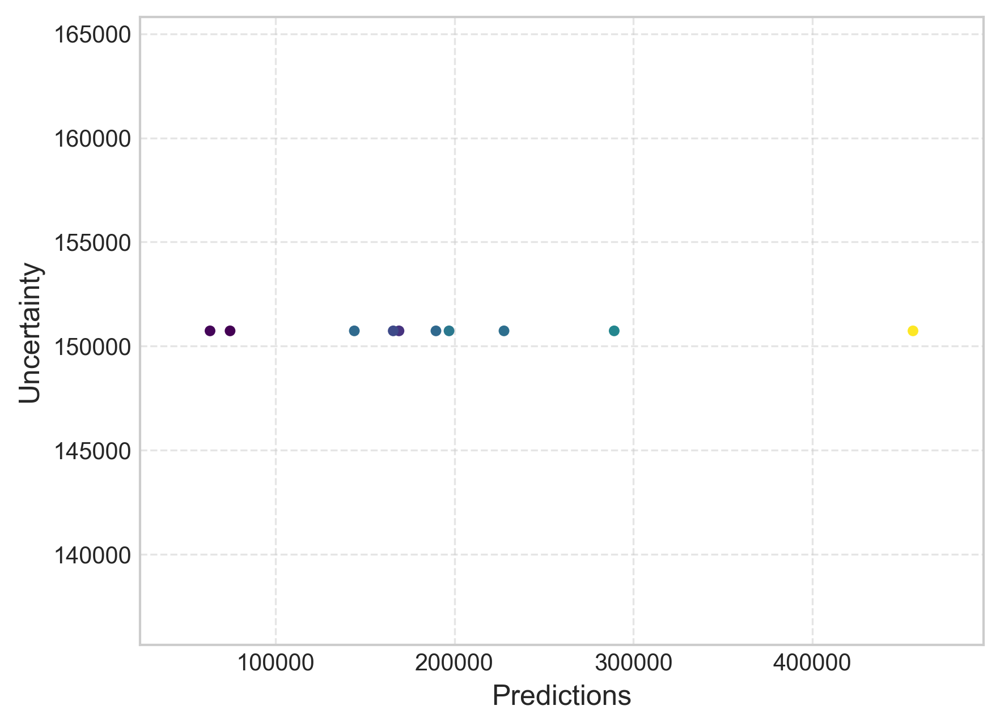

PlotRenderResult(artifact={'plotspec_version': '1.0.0', 'plot_spec': {'kind': 'global_regression', 'mode': 'regression', 'global_entries': {'proba': None, 'predict': [196970.485, 169010.485, 189660.485, 144056.495, 165780.485, 74632.48499999999, 289245.485, 227681.485, 456196.045, 63436.484999999986], 'low': [132998.0, 105038.0, 125688.0, 80084.01000000001, 101808.0, 10660.0, 225273.0, 163709.0, 392223.56, -536.0], 'high': [283733.0, 255773.0, 276423.0, 230819.01, 252543.0, 161395.0, 376008.0, 314444.0, 542958.56, 150199.0], 'uncertainty': [150735.0, 150735.0, 150735.0, 150735.0, 150735.0, 150735.0, 150735.0, 150735.0, 150735.00000000006, 150735.0], 'y_test': [np.float64(245800.0), np.float64(137900.0), np.float64(218200.0), np.float64(220800.0), np.float64(170500.0), np.float64(75000.0), np.float64(269400.0), np.float64(228900.0), np.float64(500001.0), np.float64(80800.0)], 'threshold': None, 'class_labels': None, 'is_regularized': False}, 'axis_hints': {'xlim': [63436.484999999986, 4

In [7]:
ce.plot(x_test, y_test, style="ensured")

In the examples below, all intervals will be with 90% certainty and can be either two-sided or one-sided. The intervals are defined by assigning a pair of values to the `low_high_percentiles` attribute (see below).

In [8]:
tsi = (5, 95)  # two-sided symmetric interval with 90% confidence
osli = (10, np.inf)  # one-sided lower-bounded interval with 90% confidence
osui = (-np.inf, 90)  # one-sided upper-bounded interval with 90% confidence

#### Two-sided interval with 95% confidence
Since we are defining two-sided intervals, `low_high_percentiles=tsi`.

Once the explanations are extracted, we can visualize them using various plots. The regular plot include an uncertainty estimate for the prediction and the weights of the most influential features. The shaded area is the the prediction interval with 95% confidence. The solid line in the middle of the shaded interval is the median in the conformal predictive distribution.

Regular plots are shown by calling the function `plot`, with `filter_top` indicating the number of features to include (default 10), in order of importance. 

In [9]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)
display(ce)

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, discretizer=BinaryRegressorDiscretizer(), learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))

In [10]:
print(factual_explanation[instances_to_plot].narrate(expertise_level="advanced", output_format="text"))


Instance 0

Factual Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 196970.485
Prediction Interval: [132998.000, 283733.000]

Factors impacting the calibrated prediction positively:
population (525.0) <= 1199.50             - weight ~ 31489.333 [-55273.182, 95461.818] [[!] direction uncertain]
ocean_proximity (NEAR OCEAN) = NEAR OCEAN - weight ~ 9670.987 [-77091.528, 73643.472] [[!] direction uncertain]

Factors impacting the calibrated prediction negatively:
longitude (-117.24) > -121.84             - weight ~ -127988.377 [-214750.892, -64015.892]
median_income (3.18) <= 5.04              - weight ~ -119279.770 [-206042.285, -55307.285]
housing_median_age (20.0) <= 50.50        - weight ~ -71027.060 [-157789.575, -7054.575]
total_rooms (961.0) <= 2387.50            - weight ~ -42586.750 [-129349.265, 21385.735] [[!] direction uncertain]
total_bedrooms (278.0) <= 708.50          - weight ~ -22840.060 [-109

In [11]:
print(factual_explanation[instances_to_plot].add_conjunctions(max_rule_size=3).narrate(expertise_level="advanced", output_format="text"))
factual_explanation[instances_to_plot].remove_conjunctions();



Instance 0

Factual Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 196970.485
Prediction Interval: [132998.000, 283733.000]

Factors impacting the calibrated prediction positively:
(housing_median_age (20.0) <= 50.50 AND longitude (-117.24) > -121.84 AND total_rooms (961.0) <= 2387.50)            - weight ~ 115746.808 [51774.323, 202509.323]
(housing_median_age (20.0) <= 50.50 AND total_bedrooms (278.0) <= 708.50 AND longitude (-117.24) > -121.84)          - weight ~ 109652.752 [45680.267, 196415.267]
(households (254.0) <= 505.50 AND longitude (-117.24) > -121.84 AND housing_median_age (20.0) <= 50.50)              - weight ~ 105082.416 [41109.931, 191844.931]
(ocean_proximity (NEAR OCEAN) = NEAR OCEAN AND longitude (-117.24) > -121.84 AND housing_median_age (20.0) <= 50.50) - weight ~ 104864.450 [40891.965, 191626.965]
(total_rooms (961.0) <= 2387.50 AND total_bedrooms (278.0) <= 708.50 AND longitude (-

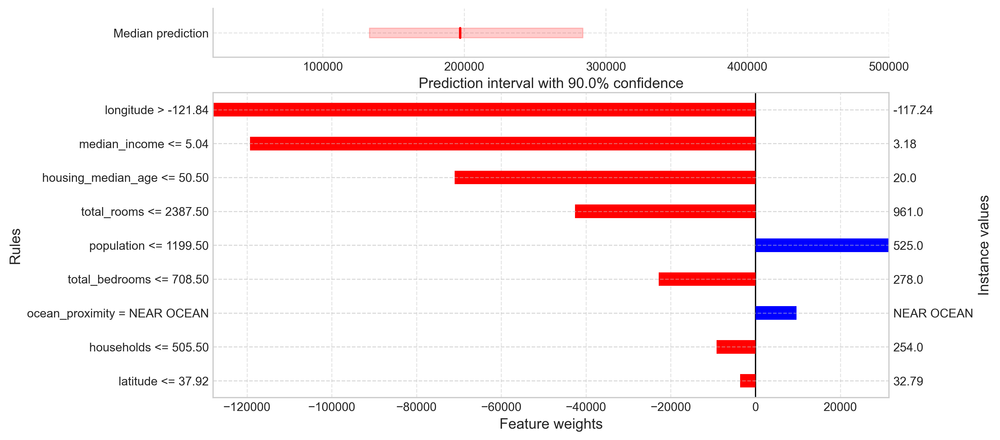

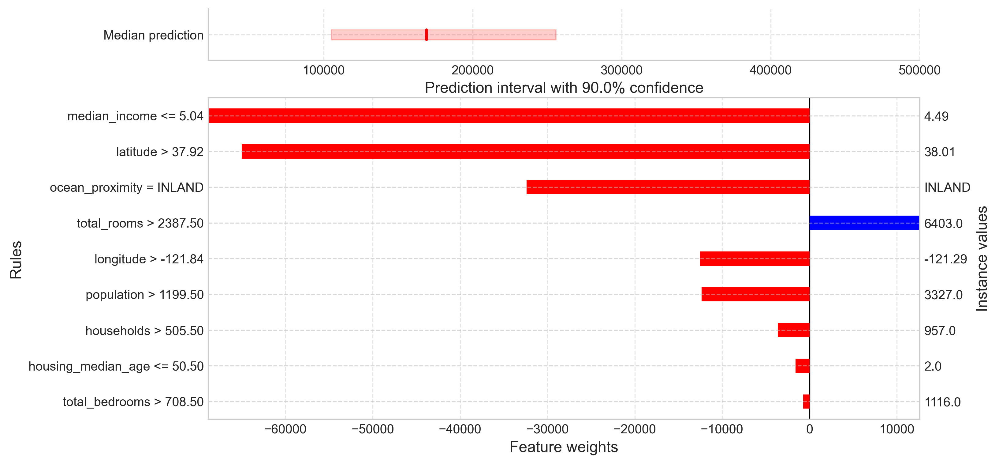

In [12]:
factual_explanation[instances_to_plot].plot()

Uncertainty plots are similar to regular plots but also provide an uncertainty estimate for the impact of each feature. Here, the shaded area is the range of possible changes with the assigned confidence interval (here a two-sided interval with 95% confidence, as defined above). The solid line in the middle of the shaded interval is the median in the conformal predictive distribution.

To get uncertainty plots, simply call `plot` with the parameter `uncertainty=True`.

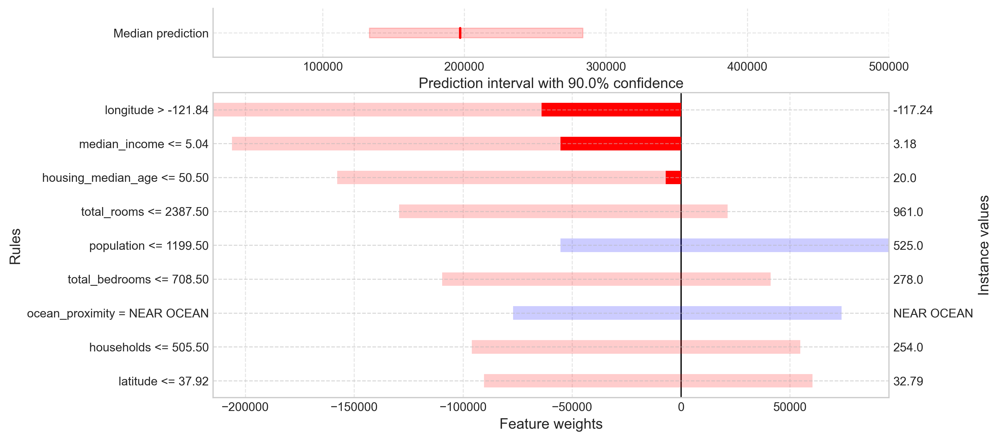

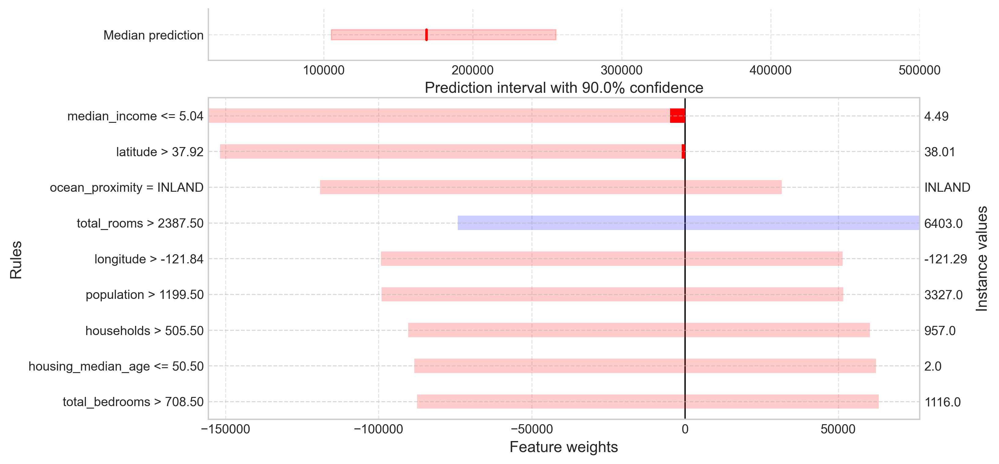

In [13]:
factual_explanation[instances_to_plot].plot(uncertainty=True)

It is also possible to add conjunctive rules through the `add_conjunctions` method. Two rules are combined by default when called without parameters but up to three rules can be combined if the parameter `num_rule_size=3`. By default, only the 5 most important rules are combined with other rules but this number can also be adjusted through the parameter `num_to_include`.

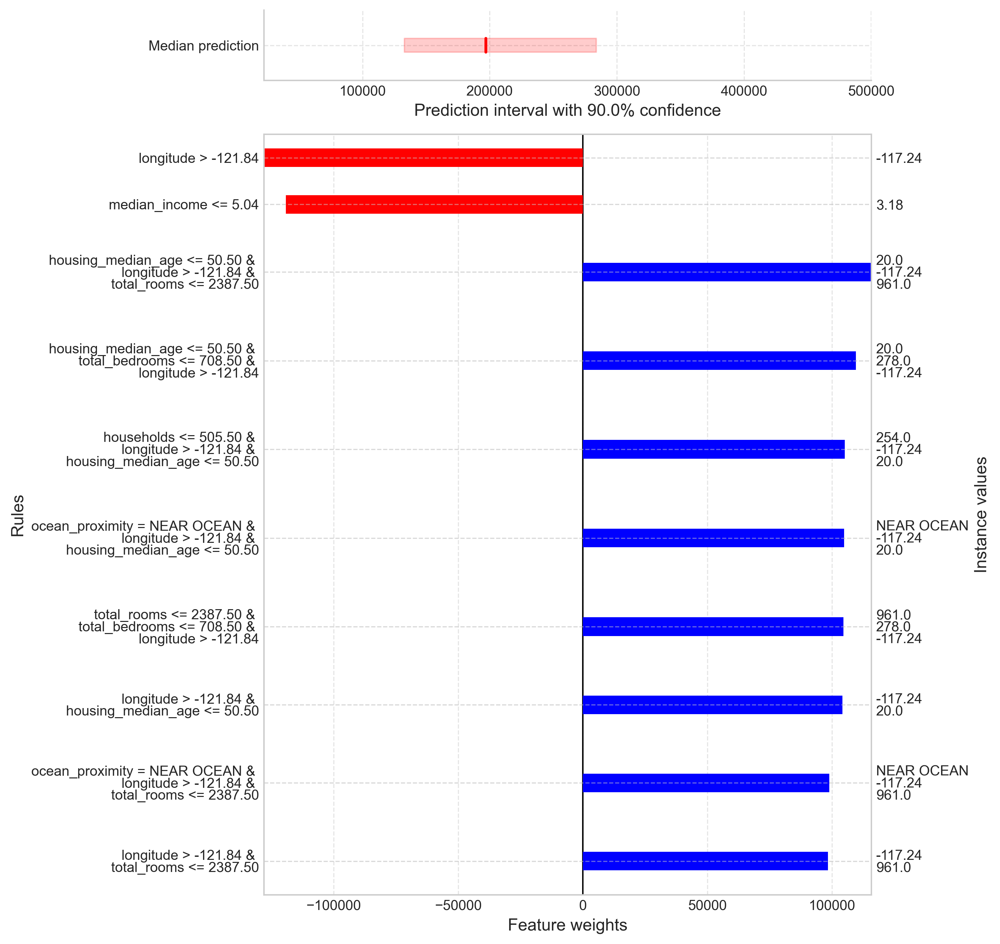

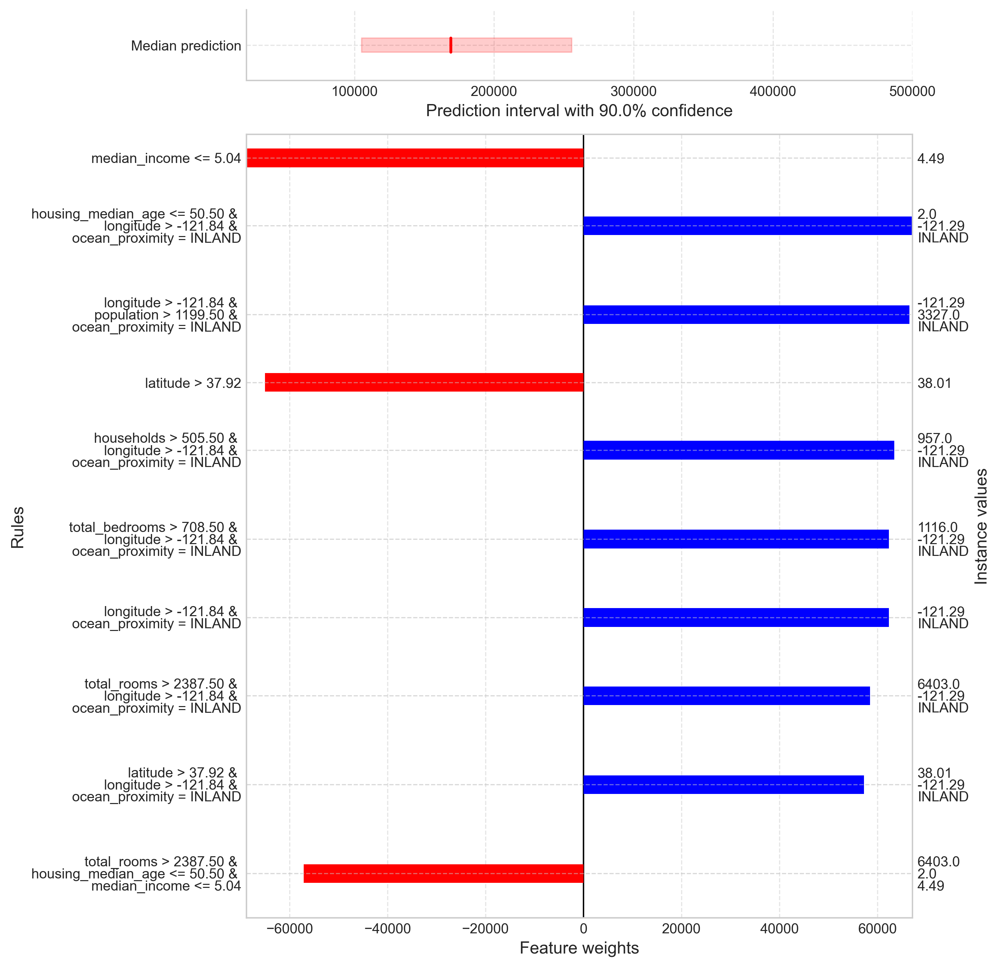


Instance 0

Factual Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 196970.485
Prediction Interval: [132998.000, 283733.000]

Factors impacting the calibrated prediction positively:
(housing_median_age (20.0) <= 50.50 AND longitude (-117.24) > -121.84 AND total_rooms (961.0) <= 2387.50)            - weight ~ 115746.808 [51774.323, 202509.323]
(housing_median_age (20.0) <= 50.50 AND total_bedrooms (278.0) <= 708.50 AND longitude (-117.24) > -121.84)          - weight ~ 109652.752 [45680.267, 196415.267]
(households (254.0) <= 505.50 AND longitude (-117.24) > -121.84 AND housing_median_age (20.0) <= 50.50)              - weight ~ 105082.416 [41109.931, 191844.931]
(ocean_proximity (NEAR OCEAN) = NEAR OCEAN AND longitude (-117.24) > -121.84 AND housing_median_age (20.0) <= 50.50) - weight ~ 104864.450 [40891.965, 191626.965]
(total_rooms (961.0) <= 2387.50 AND total_bedrooms (278.0) <= 708.50 AND longitude (-

In [14]:
factual_explanation[instances_to_plot].add_conjunctions(max_rule_size=3).plot()
print(factual_explanation[instances_to_plot].narrate(output_format="text"))

If the conjunctions are no longer wanted, they can be removed with `remove_conjunctions`.

In [15]:
factual_explanation[instances_to_plot].remove_conjunctions();

#### One-sided lower-bounded interval with 95% confidence
To change confidence or interval type, new explanations must be extracted. Here `low_high_percentiles=osli` to get a one-sided lower-bounded interval.

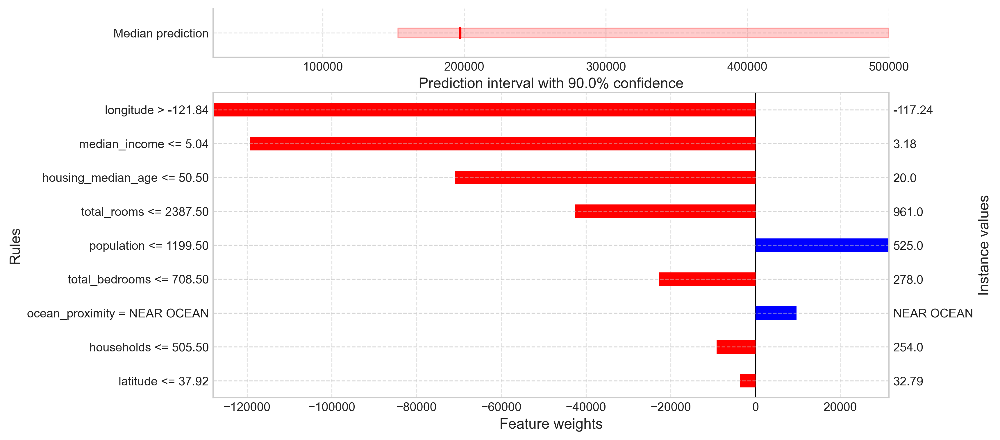

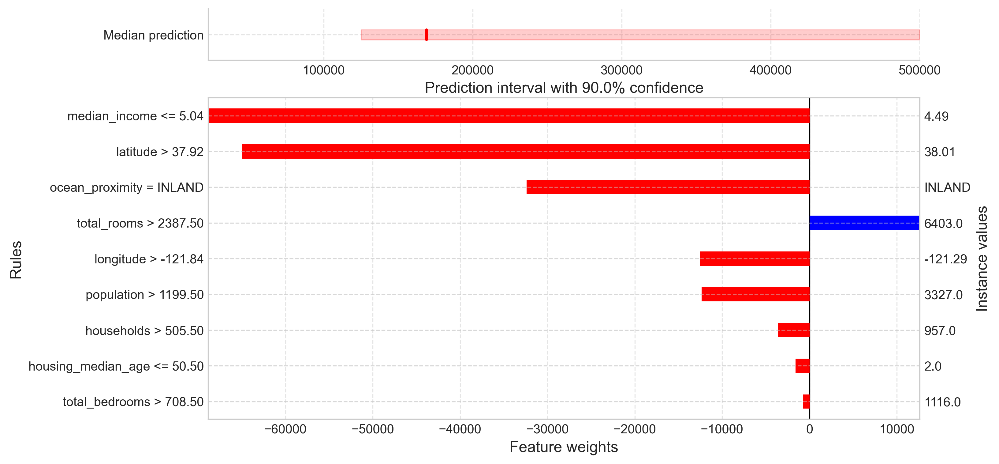

In [16]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation[instances_to_plot].plot()

#### One-sided upper-bounded interval with 95% confidence
Here `low_high_percentiles=osui` to get a one-sided upper-bounded interval.

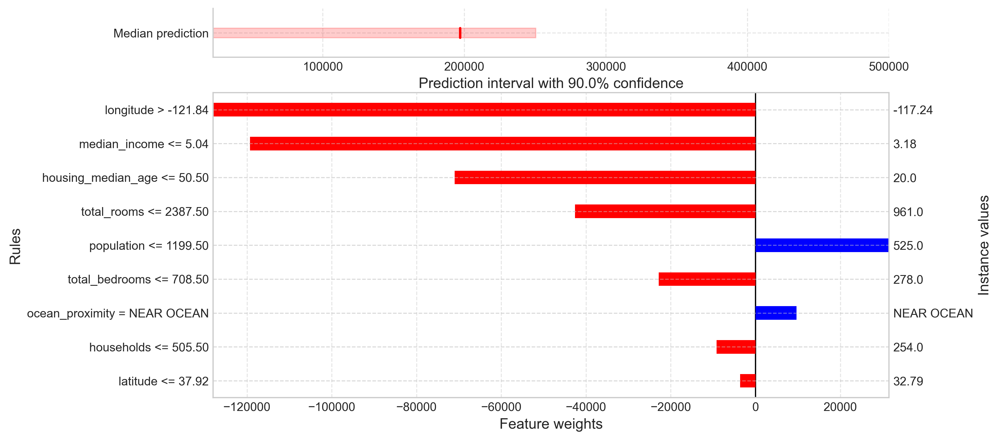

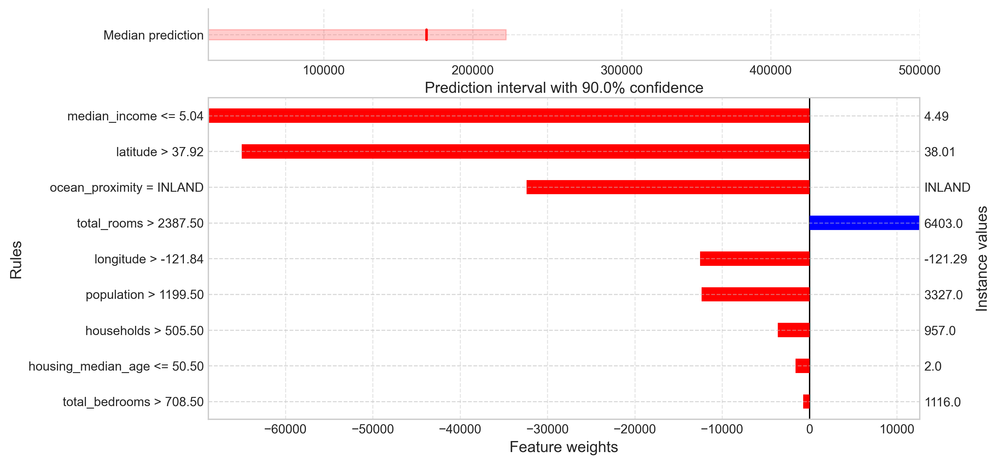

In [17]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation[instances_to_plot].plot()

#### Two-sided alternative rules 

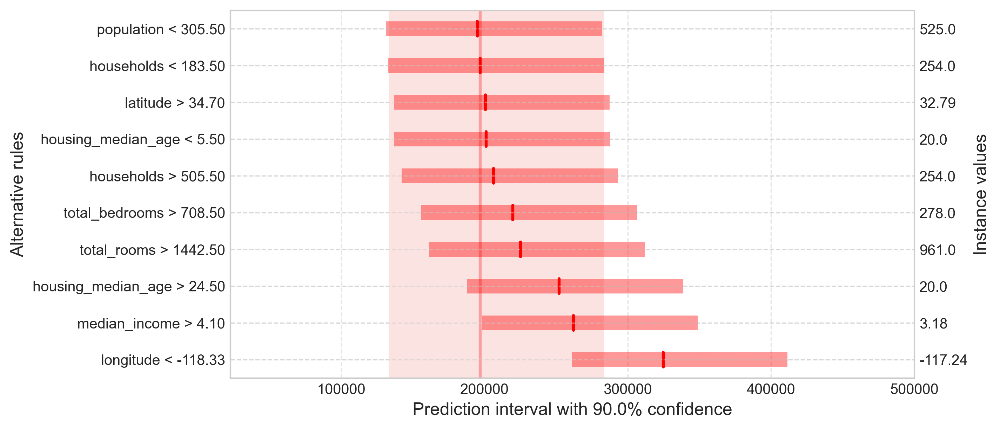

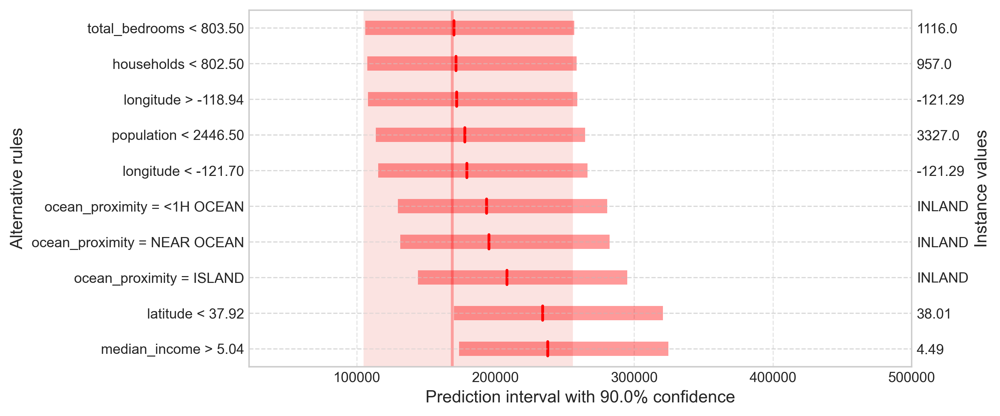

WrapCalibratedExplainer(learner=RandomForestRegressor(oob_score=True), fitted=True, calibrated=True, 
		explainer=CalibratedExplainer(mode=regression, discretizer=RegressorDiscretizer(), learner=RandomForestRegressor(oob_score=True), difficulty_estimator=None))

In [18]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
alternative_explanation[instances_to_plot].plot()
display(ce)

#### One-sided alternative rules

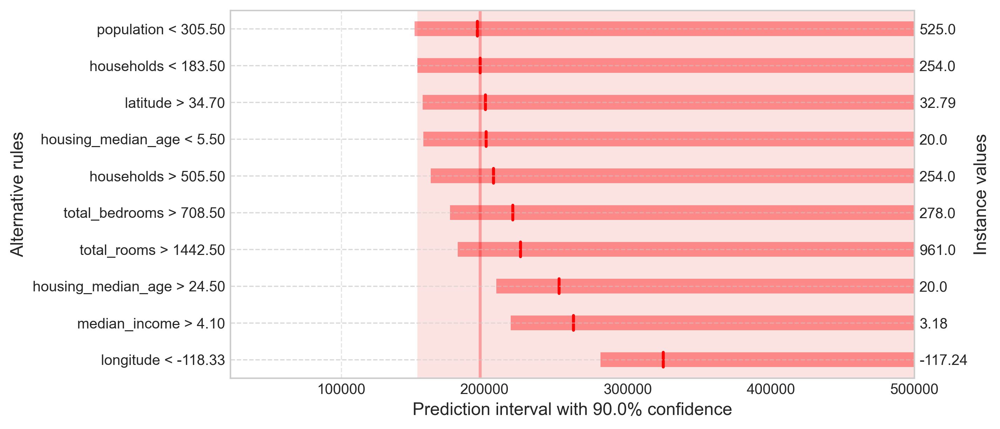

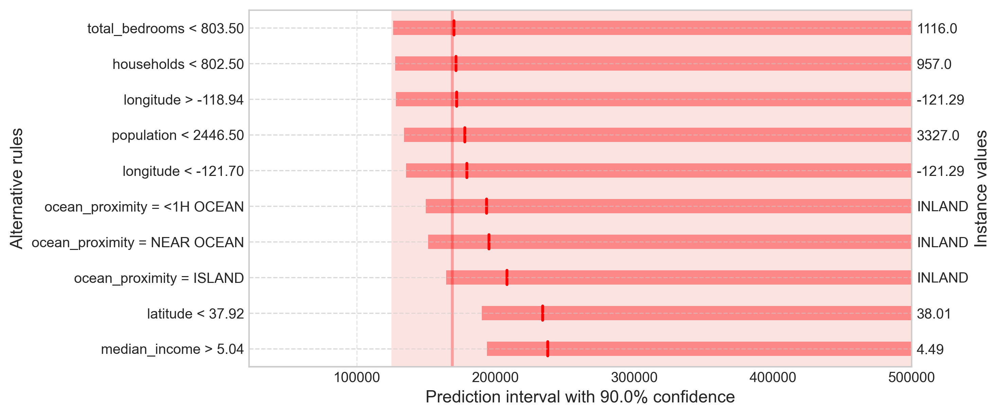

In [19]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation[instances_to_plot].plot()

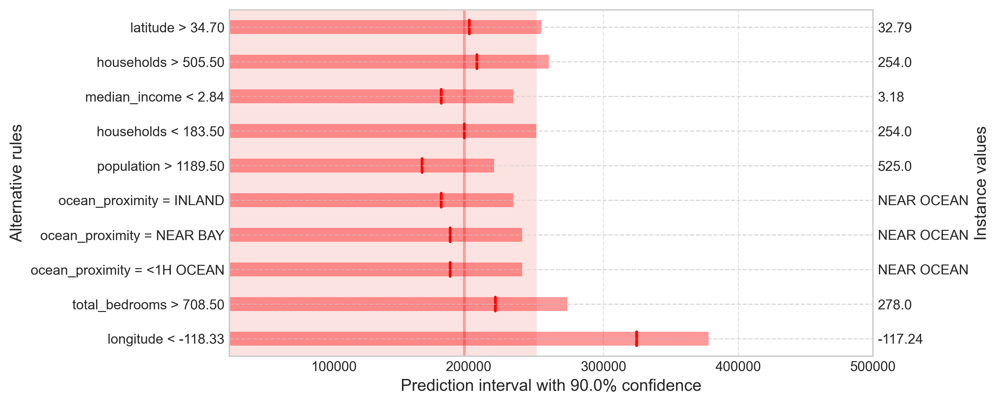

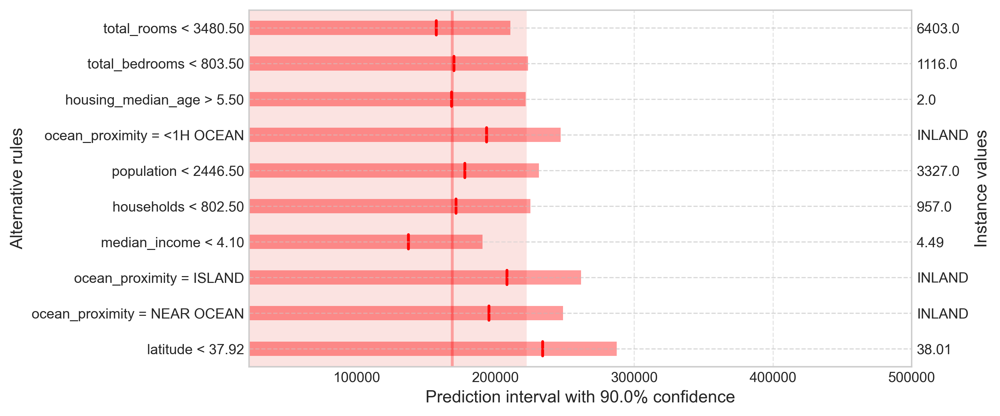

In [20]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation[instances_to_plot].plot()

### Normalized explanations
Normalized explanations can be achieved through the use k-nearest neighbor or by using the variance (if using an ensemble model like a RandomForestRegressor).

#### Normalized explanations using knn

There are three ways to set the difficulty estimator (sigma) for the WrapCalibratedExplainer when using k-nearest neighbor.
* alternative 1: by the (Euclidean) distances to the nearest neighbors
* alternative 2: by the standard deviation of the targets of the nearest neighbors
* alternative 3: by the absolute errors of the k nearest neighbors

See the documentation of crepes for further details on how the `DifficultyEstimator` works, see [here](https://crepes.readthedocs.io/en/latest/).

In [21]:
# alternative 1: by the (Euclidean) distances to the nearest neighbors
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, scaler=True))

# alternative 2: by the standard deviation of the targets of the nearest neighbors
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, y=y_prop_train, scaler=True))

# alternative 3: by the absolute errors of the k nearest neighbors
oob_predictions = model.oob_prediction_  # requires the model to have been trained with oob_score=True, available for RandomForestRegressor
residuals_oob = y_prop_train - oob_predictions
ce.set_difficulty_estimator(
    DifficultyEstimator().fit(X=X_prop_train, residuals=residuals_oob, scaler=True)
)

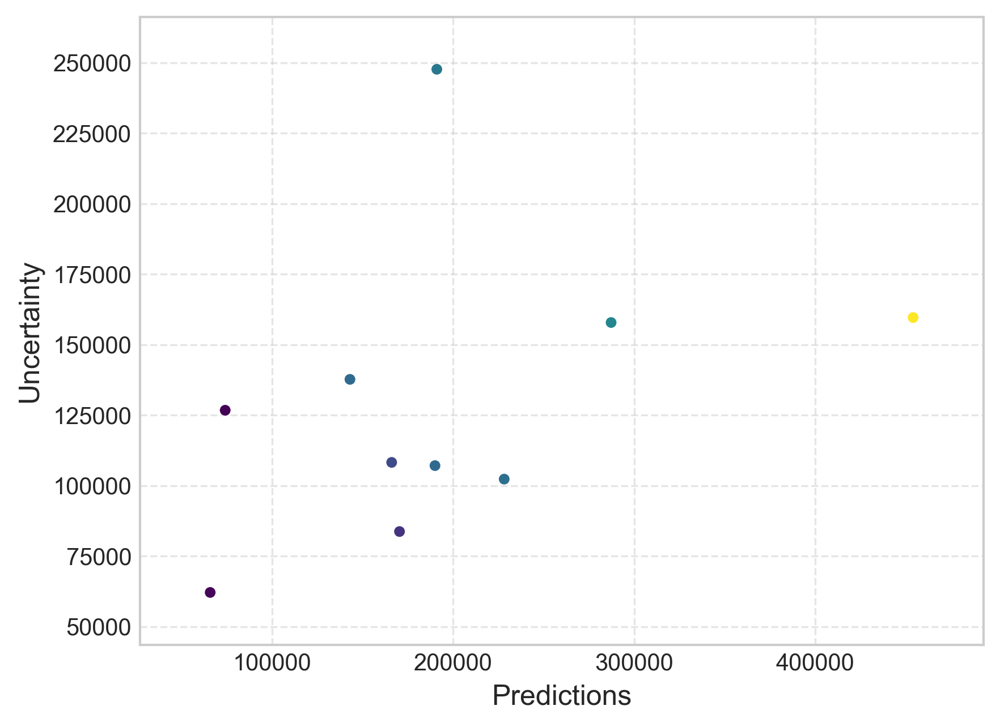

PlotRenderResult(artifact={'plotspec_version': '1.0.0', 'plot_spec': {'kind': 'global_regression', 'mode': 'regression', 'global_entries': {'proba': None, 'predict': [190987.40270852018, 170375.03698355053, 189977.3982632893, 143002.4303013875, 166045.95936288795, 74069.0703078053, 287287.55256278184, 228212.76215139043, 454159.3610845315, 65769.22587208092], 'low': [91027.10668963884, 136585.763019163, 146753.34267141554, 87431.6778602266, 122358.65744090152, 22916.993481194702, 223576.78527781297, 186919.2160318551, 389739.3769810507, 40699.22751366342], 'high': [338713.279587172, 220310.36455140106, 253855.87570752416, 225127.41852297448, 230609.04332643305, 149663.93851375664, 381442.2253541268, 289238.2447968716, 549362.1467825447, 102818.810940777], 'uncertainty': [247686.17289753314, 83724.60153223807, 107102.53303610862, 137695.74066274788, 108250.38588553153, 126746.94503256194, 157865.4400763138, 102319.02876501653, 159622.76980149397, 62119.583427113575], 'y_test': [np.float

In [22]:
ce.plot(x_test, y_test, style="ensured")

In [23]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)

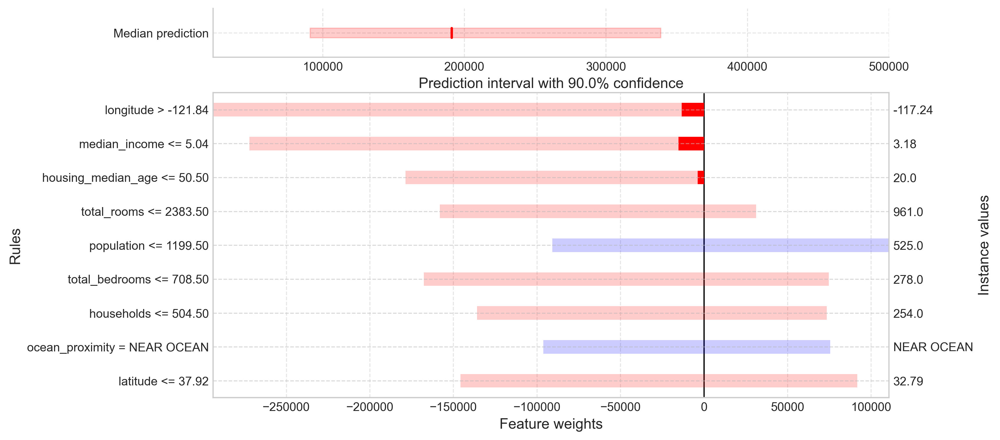

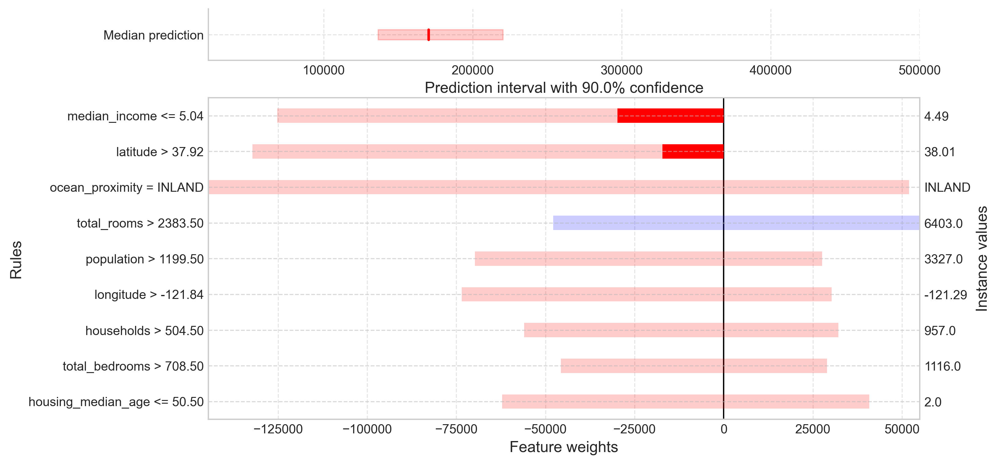

In [24]:
factual_explanation[instances_to_plot].plot(uncertainty=True)

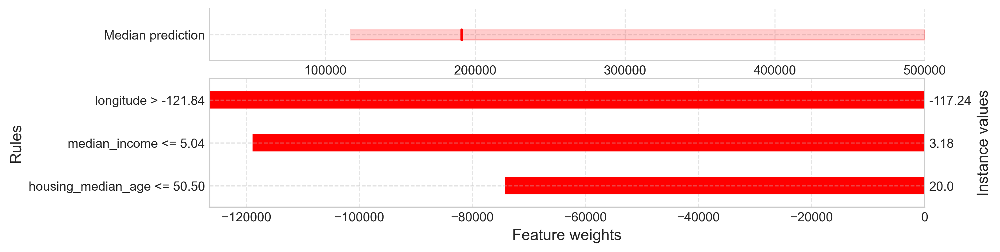

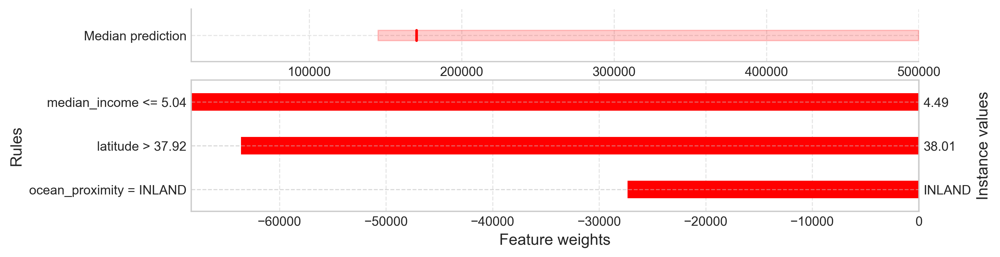

In [25]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation[instances_to_plot].plot(filter_top=3)

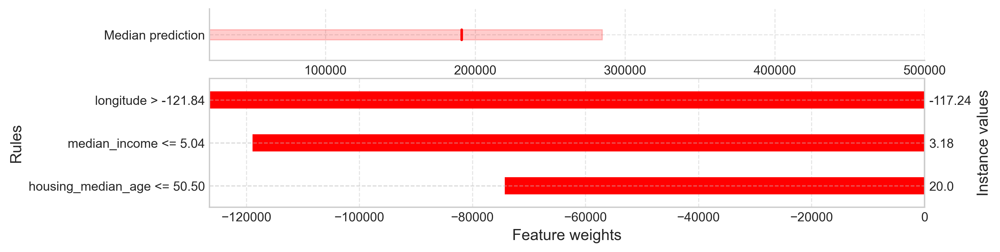

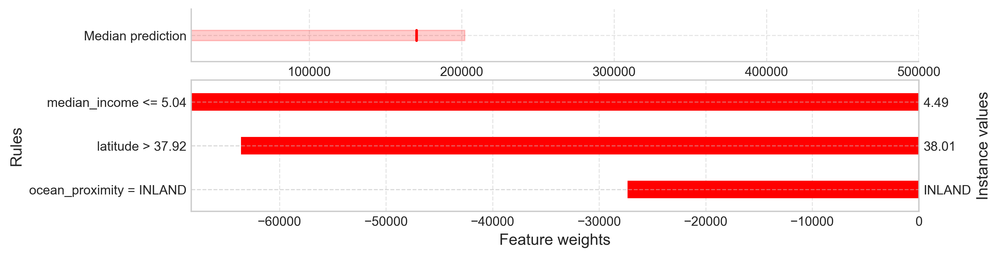

In [26]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation[instances_to_plot].plot(filter_top=3)

#### Normalized alternatives using knn 

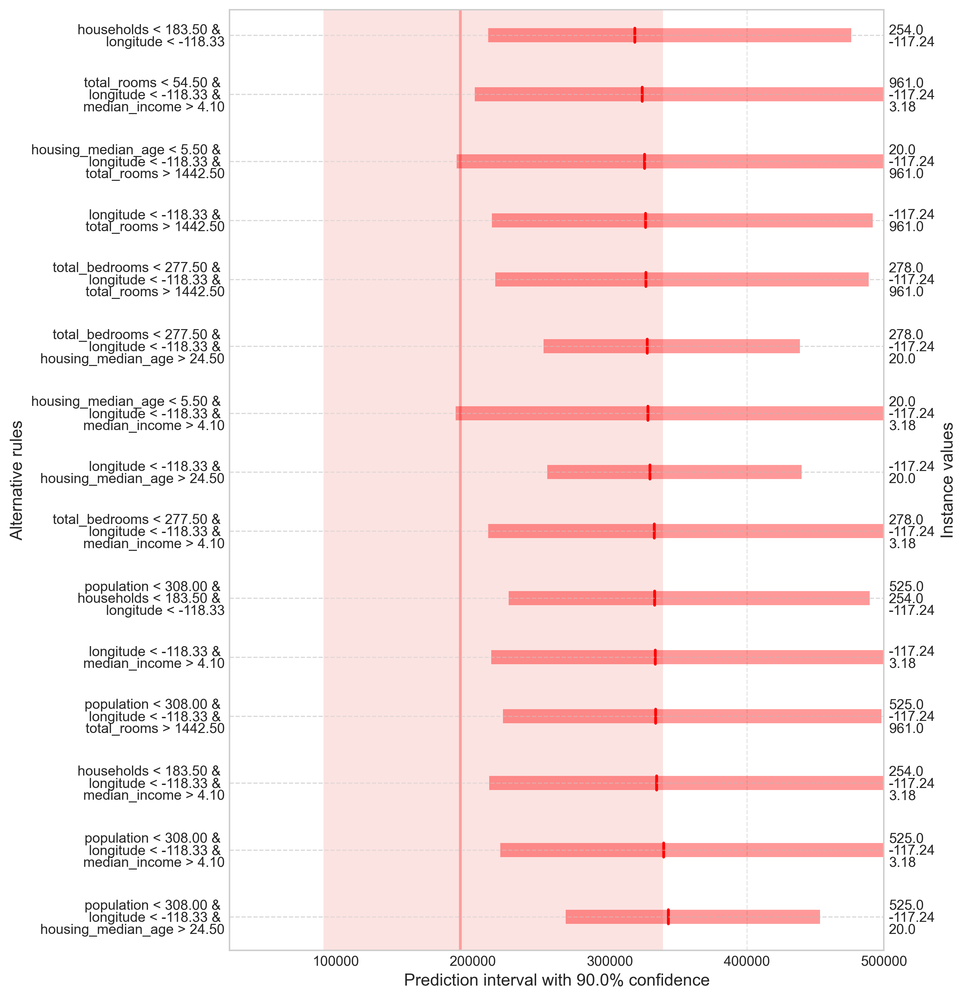

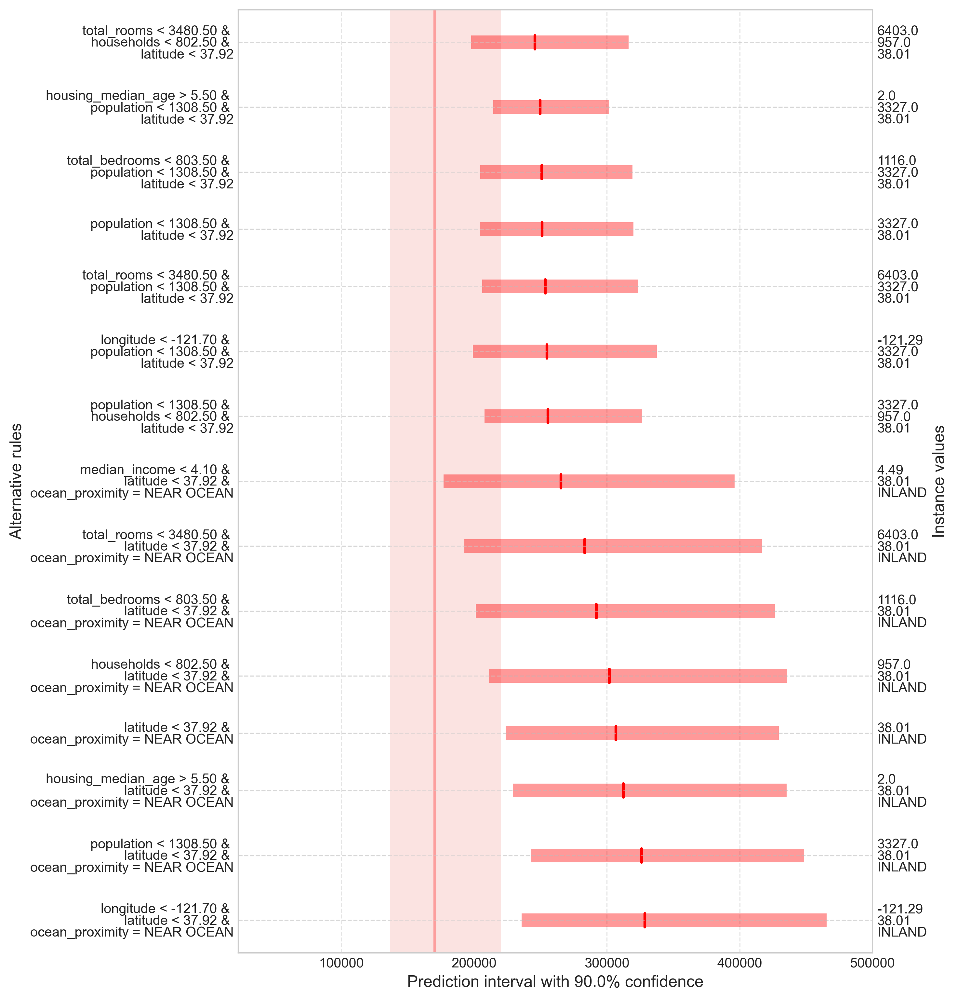

In [27]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
alternative_explanation[instances_to_plot].add_conjunctions(n_top_features=5, max_rule_size=3).plot(filter_top=15, rnk_metric='uncertainty')


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 190987.403
Prediction Interval: [91027.107, 338713.280]

Alternatives to increase the Calibrated Prediction compared to 190987.403:
- If longitude < -118.33         then 317536.183 [206808.661, 481174.355]
- If median_income > 4.10        then 256000.694 [155133.142, 405067.355]
- If housing_median_age > 24.50  then 251723.641 [203890.584, 322413.511]
- If total_rooms > 1442.50       then 221598.216 [143957.972, 336338.504]
- If total_bedrooms > 708.50     then 214063.717 [116231.069, 358645.258]
- If households > 504.50         then 201906.652 [117453.333, 326715.612]
- If housing_median_age < 5.50   then 197231.130 [116945.956, 315880.214]
- If latitude > 34.70            then 196758.234 [116248.854, 315738.661]

Alternatives to decrease the Calibrated Prediction compared to 190987.403:
- If population > 1189.50        then 161526.03

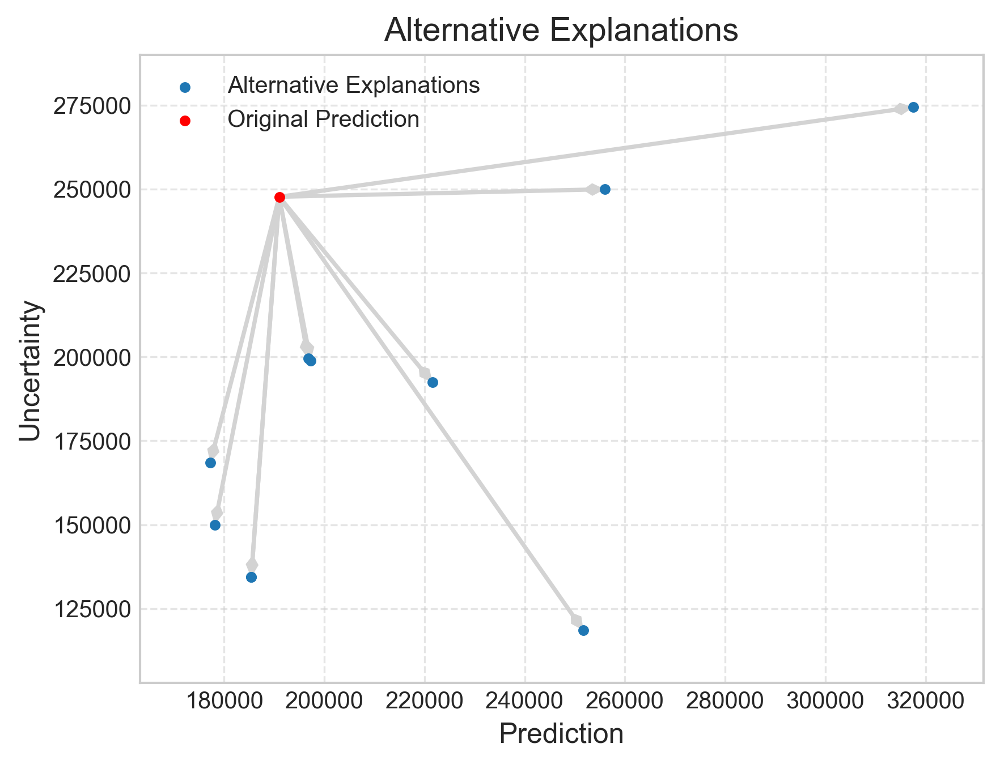

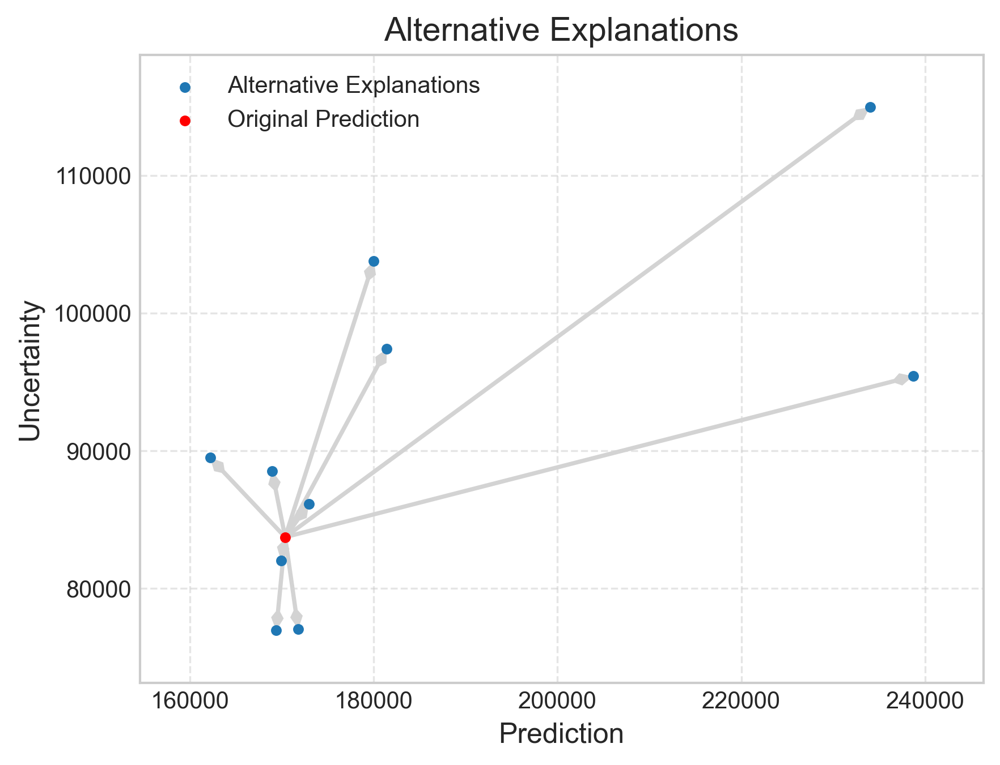


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 190987.403
Prediction Interval: [91027.107, 338713.280]

Alternatives to increase the Calibrated Prediction compared to 190987.403:
- If (population < 308.00 AND longitude < -118.33 AND housing_median_age > 24.50)                                                                                  then 342691.045 [267774.982, 453405.413]
- If (households < 183.50 AND population < 308.00 AND longitude < -118.33 AND housing_median_age > 24.50)                                                          then 342679.917 [265226.026, 457144.805]
- If (population < 308.00 AND households < 183.50 AND longitude < -118.33 AND median_income > 4.10)                                                                then 340146.384 [216970.407, 522181.451]
- If (total_bedrooms < 277.50 AND households < 183.50 AND population < 308.00 AND longitude < -118.33 A

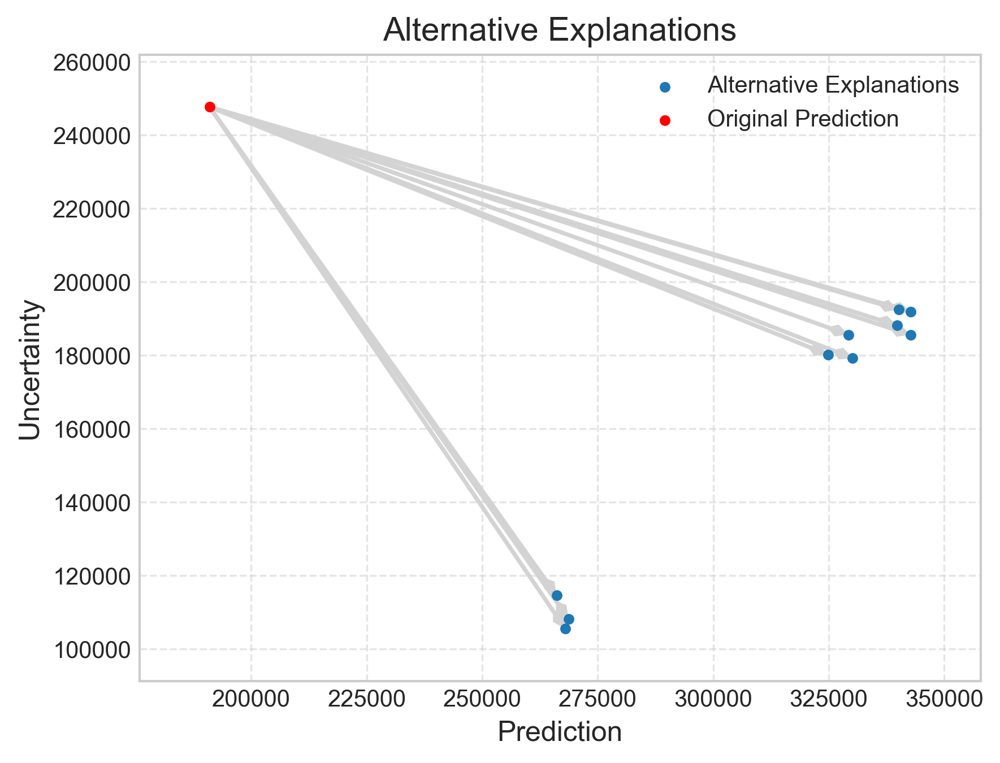

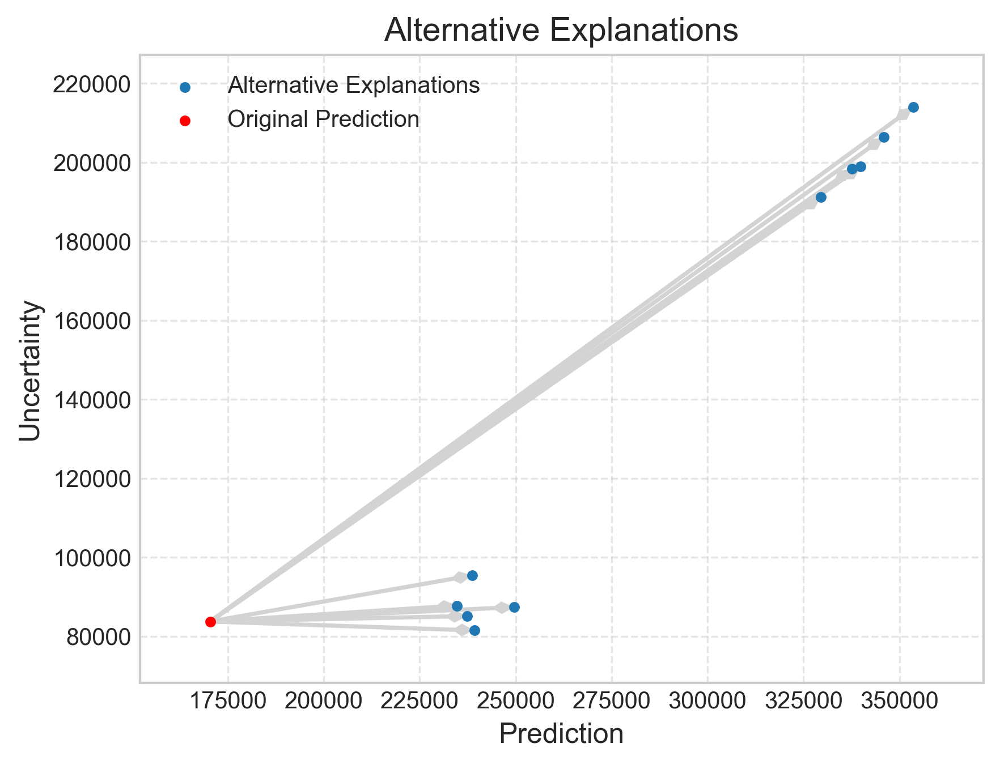

In [28]:
print(alternative_explanation[instances_to_plot].remove_conjunctions().narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")
print(alternative_explanation[instances_to_plot].add_conjunctions(max_rule_size=7).narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")

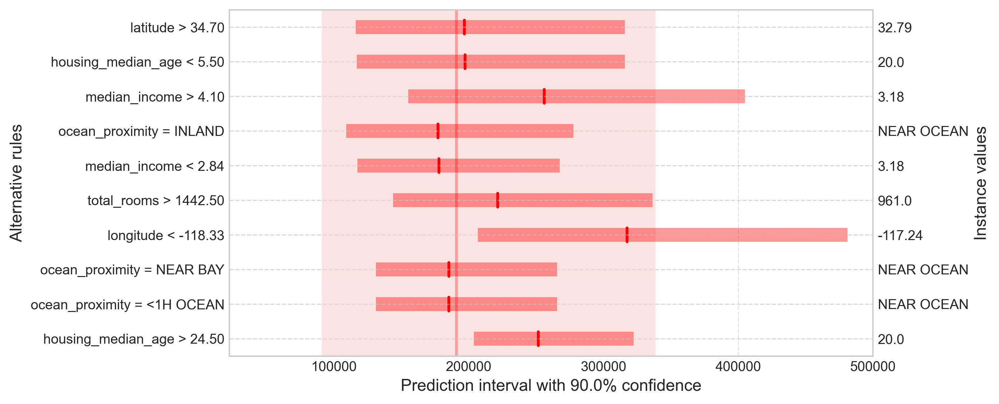

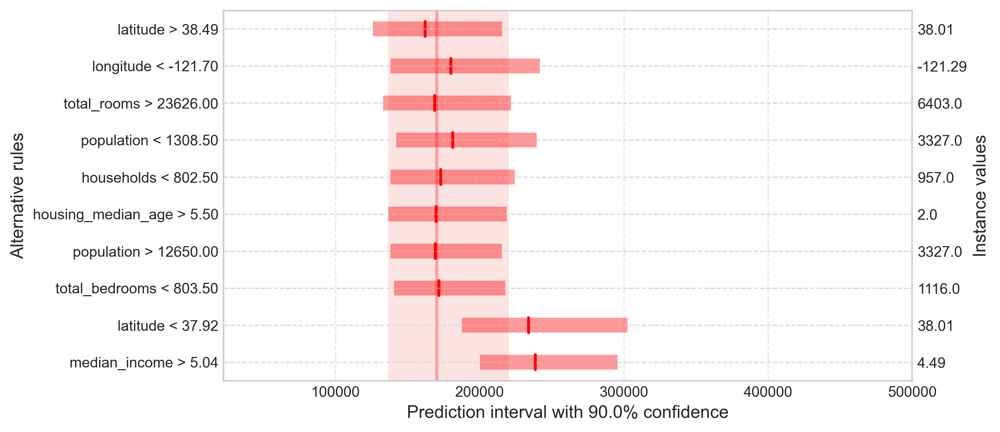

In [29]:
alternative_explanation[instances_to_plot].remove_conjunctions().plot()

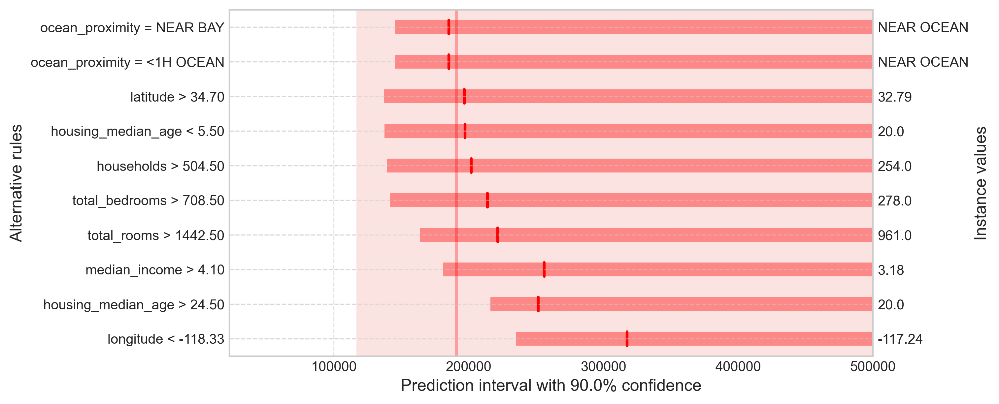

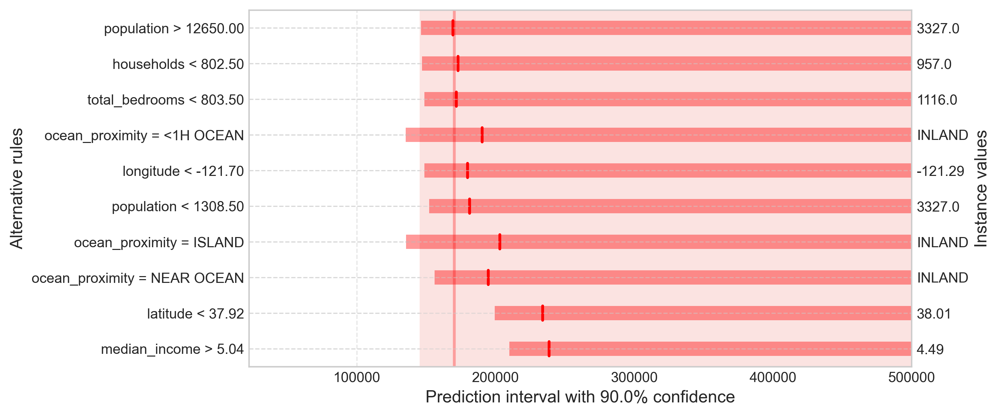

In [30]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation[instances_to_plot].plot()

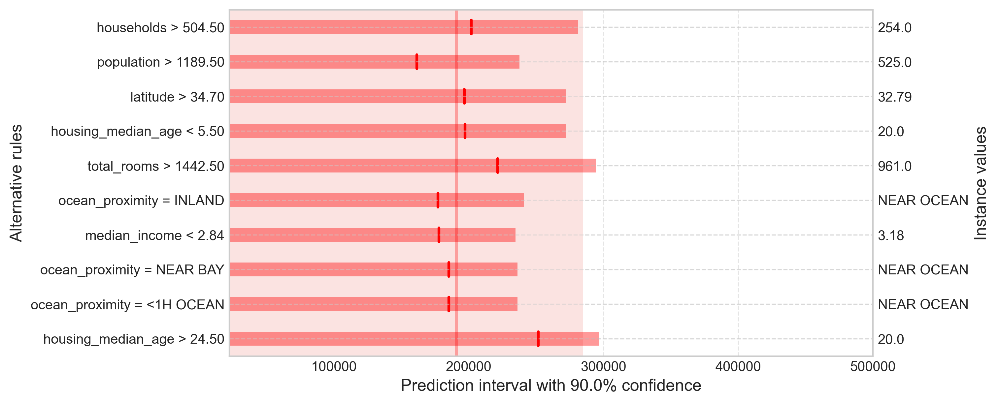

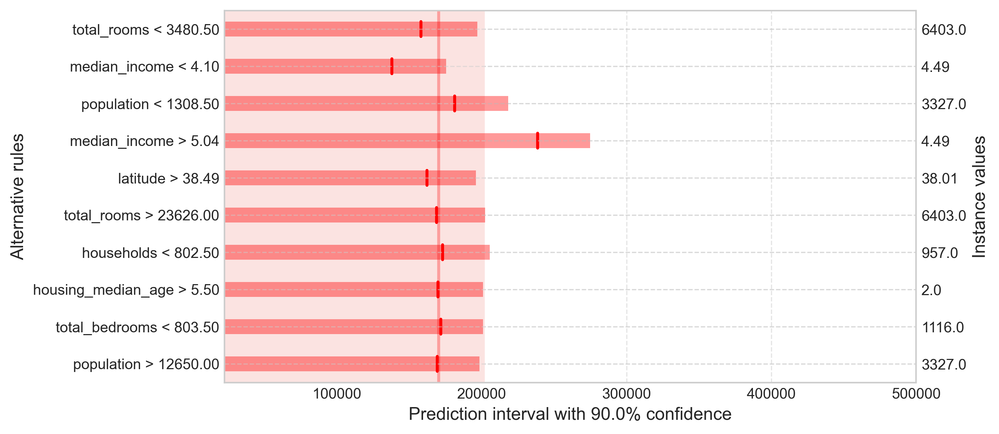

In [31]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation[instances_to_plot].plot()

#### Normalized explanations using variance

In [32]:
ce.set_difficulty_estimator(DifficultyEstimator().fit(X=X_prop_train, learner=model, scaler=True))

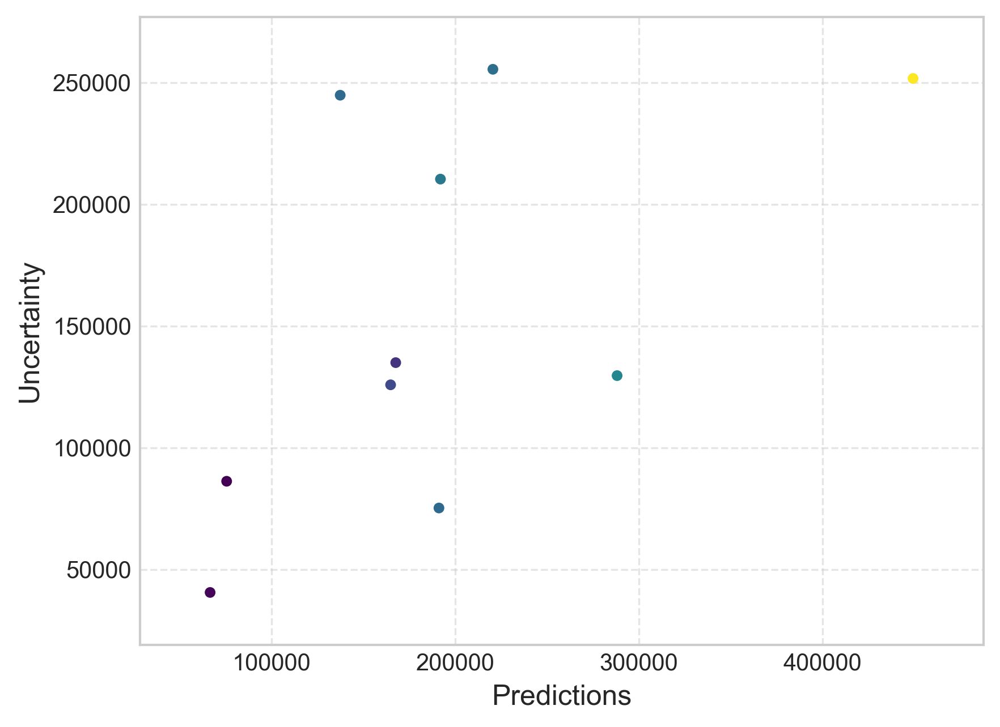

PlotRenderResult(artifact={'plotspec_version': '1.0.0', 'plot_spec': {'kind': 'global_regression', 'mode': 'regression', 'global_entries': {'proba': None, 'predict': [191980.73514986137, 167642.814107473, 191161.38873678655, 137411.0906081125, 164850.41796783847, 75606.0376915042, 288134.2517962955, 220524.33306716144, 449219.80489870504, 66604.0806603489], 'low': [104172.606710591, 111305.06360142883, 159747.20526796856, 35217.83286452206, 112314.78194684665, 39609.9726864924, 234024.55624929856, 113884.76459743826, 344152.08612577146, 49670.92461986422], 'high': [314468.23013635806, 246230.86803043314, 234982.44162260182, 279965.0473773772, 238134.73193865924, 125818.56254772385, 363614.29196840245, 369280.6480059464, 595783.4762260481, 90224.89917089163], 'uncertainty': [210295.62342576706, 134925.80442900432, 75235.23635463326, 244747.21451285516, 125819.9499918126, 86208.58986123145, 129589.73571910389, 255395.88340850815, 251631.39010027662, 40553.97455102741], 'y_test': [np.floa

In [33]:
ce.plot(x_test, y_test, style="ensured")

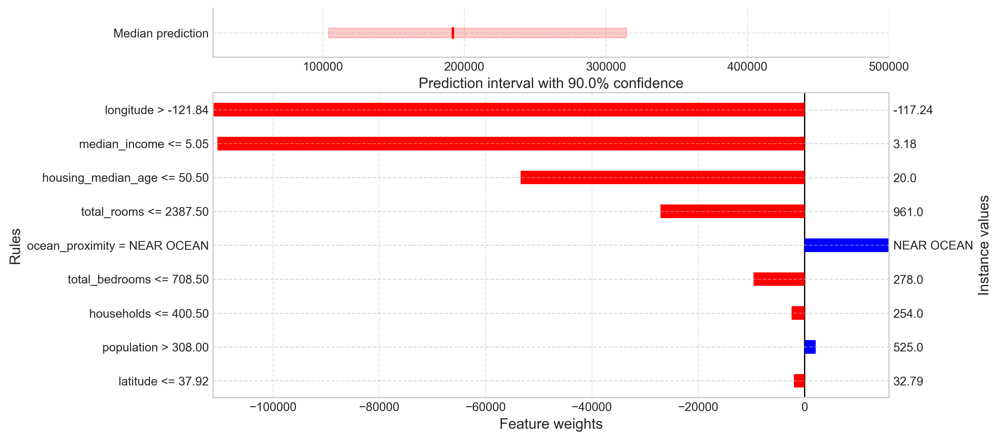

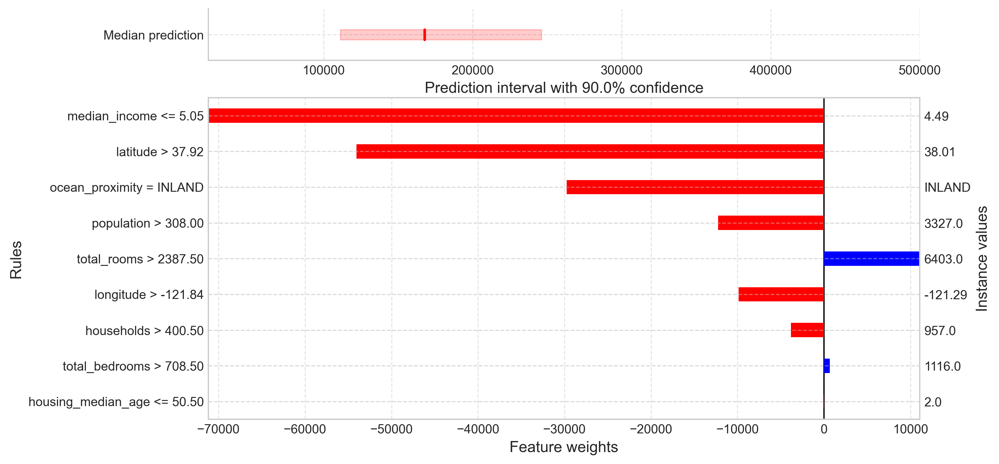

In [34]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=tsi)
factual_explanation[instances_to_plot].plot(filter_top=10)

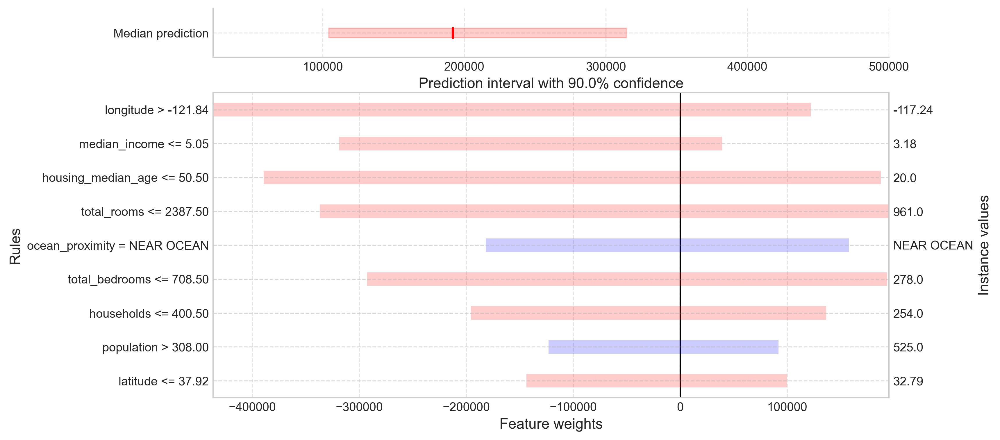

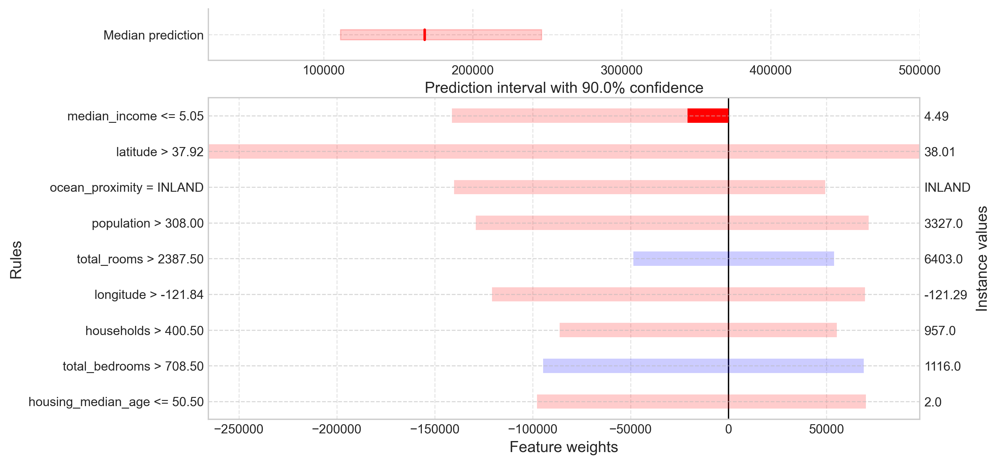

In [35]:
factual_explanation[instances_to_plot].plot(uncertainty=True, filter_top=15)

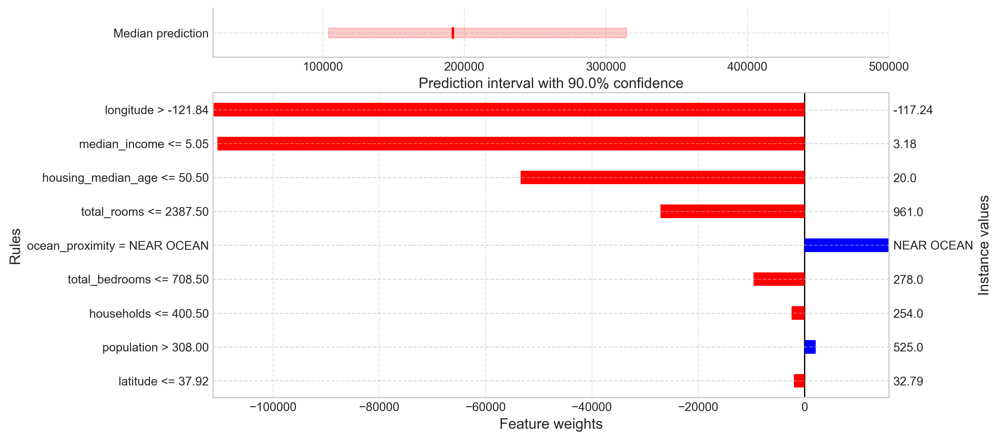

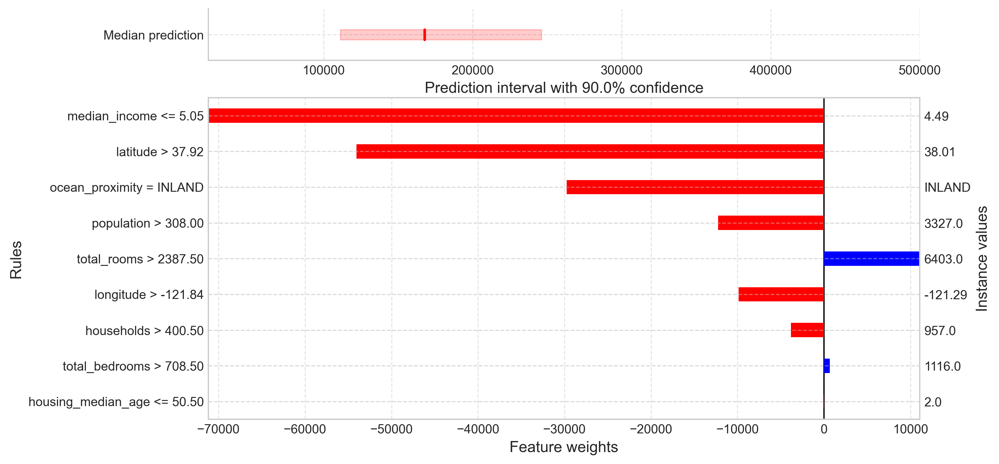

In [36]:
factual_explanation[instances_to_plot].remove_conjunctions()
factual_explanation[instances_to_plot].plot()

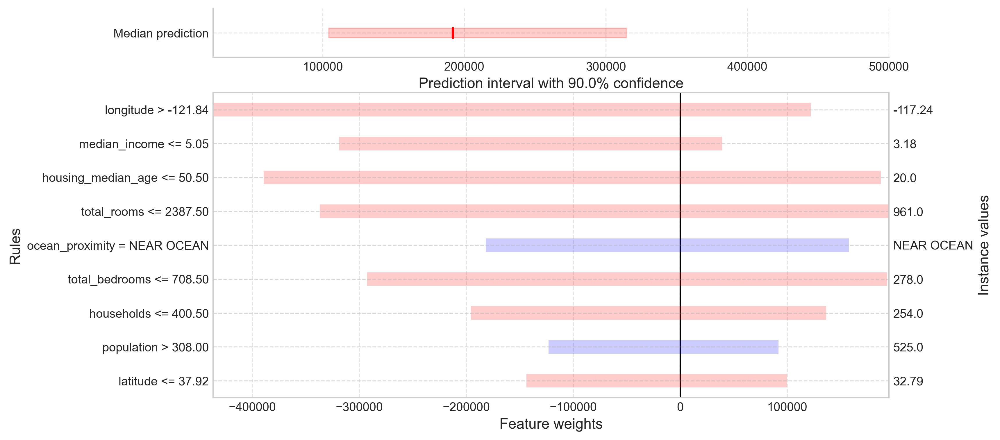

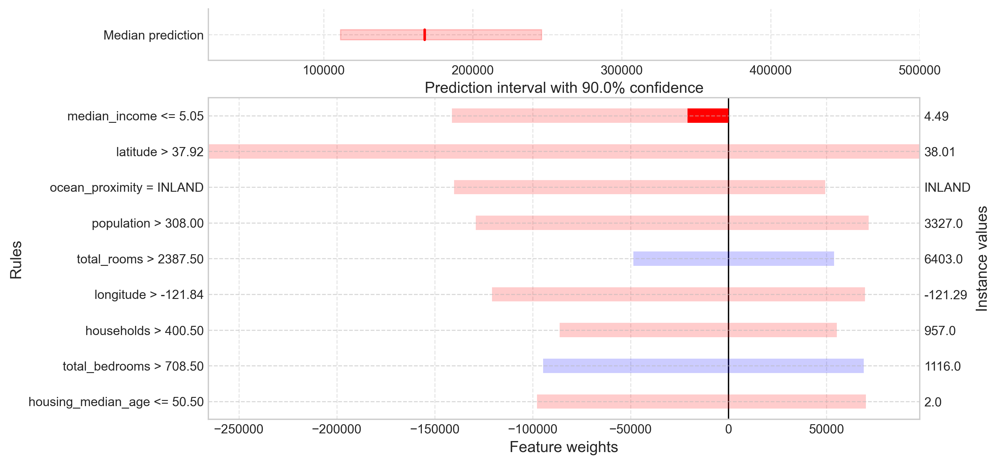

In [37]:
factual_explanation[instances_to_plot].plot(uncertainty=True)

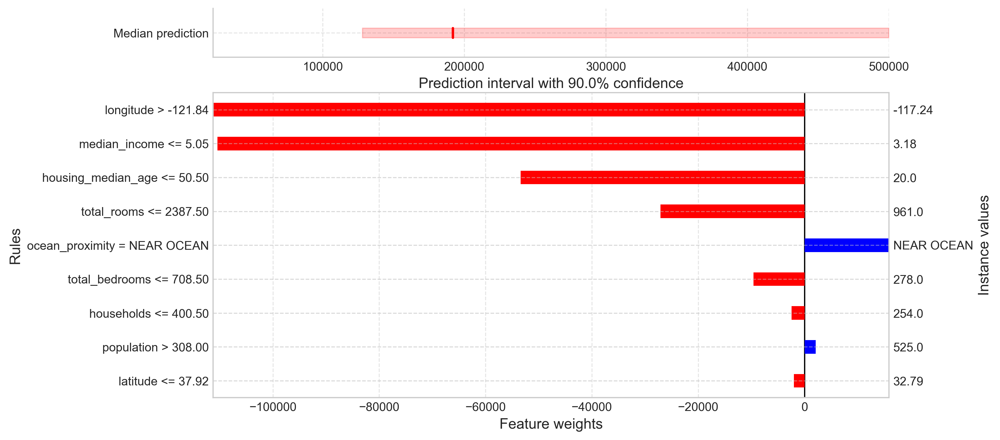

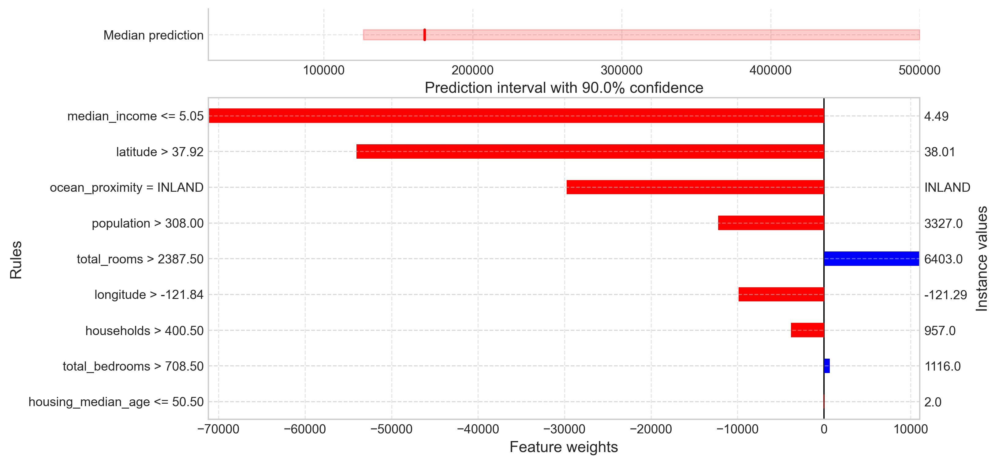

In [38]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osli)
factual_explanation[instances_to_plot].plot()

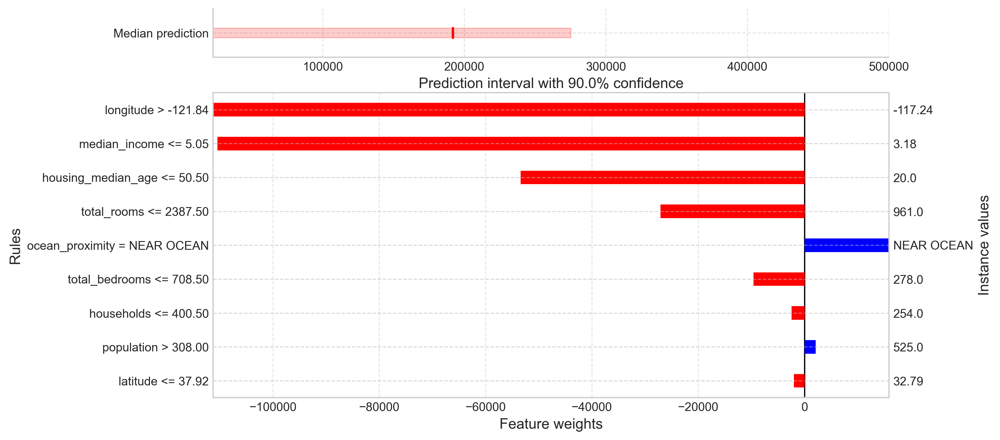

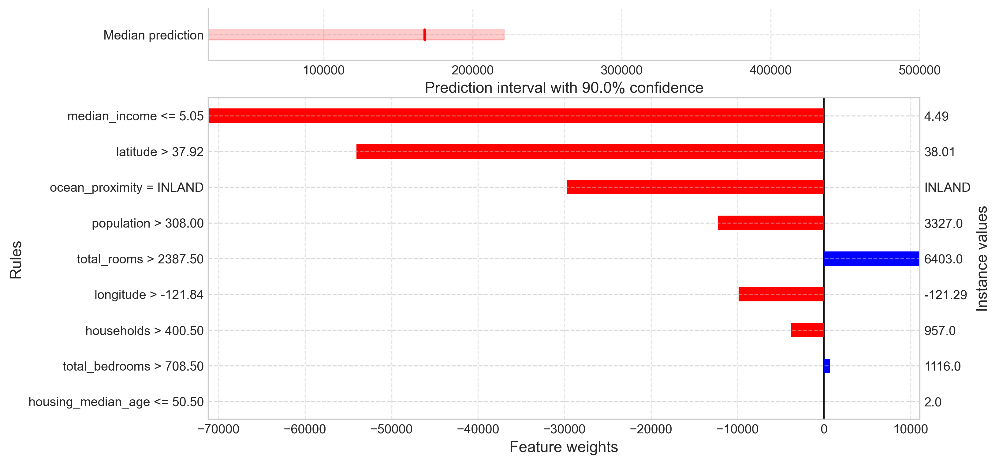

In [39]:
factual_explanation = ce.explain_factual(x_test, low_high_percentiles=osui)
factual_explanation[instances_to_plot].plot()

#### Normalized alternatives using variance

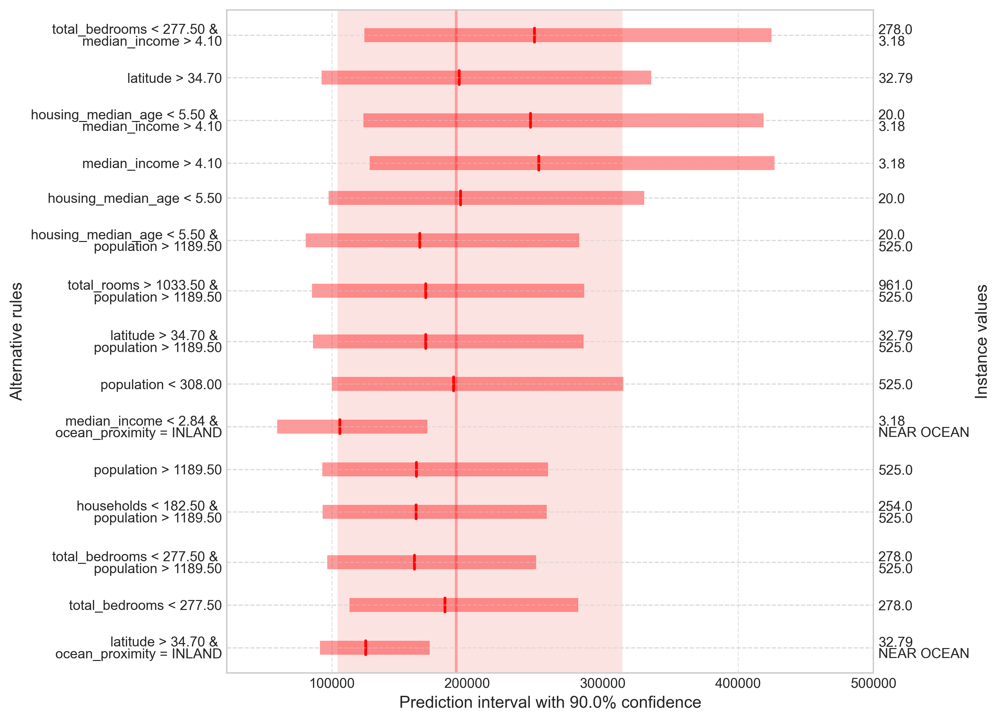

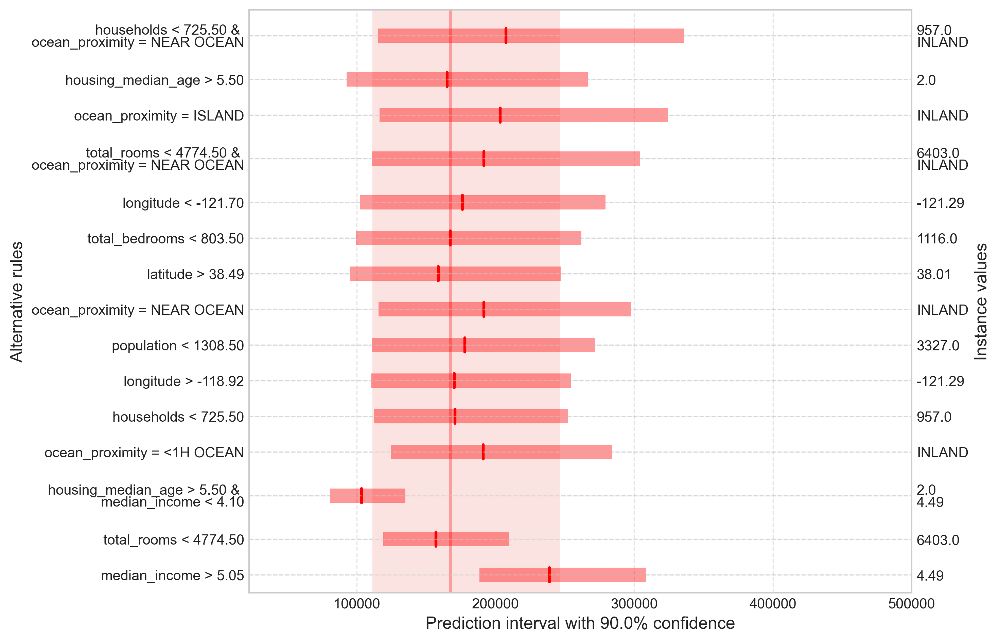

In [40]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi)
alternative_explanation[instances_to_plot].add_conjunctions().plot(filter_top=15)


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 191980.735
Prediction Interval: [104172.607, 314468.230]

Alternatives to increase the Calibrated Prediction compared to 191980.735:
- If longitude < -118.33         then 303884.048 [78441.111, 618364.509]
- If median_income > 4.10        then 252827.193 [127940.301, 427037.518]
- If housing_median_age > 24.50  then 240990.819 [101590.966, 435445.924]
- If total_rooms > 1033.50       then 208802.166 [36956.498, 448517.392]
- If total_bedrooms > 708.50     then 201571.793 [-1350.092, 484636.627]
- If housing_median_age < 5.50   then 194946.586 [97640.650, 330682.999]
- If households > 335.50         then 194293.942 [55268.849, 388226.277]
- If latitude > 34.70            then 193997.524 [92338.112, 335806.794]

Alternatives to decrease the Calibrated Prediction compared to 191980.735:
- If ocean_proximity = INLAND    then 161776.789 [-3

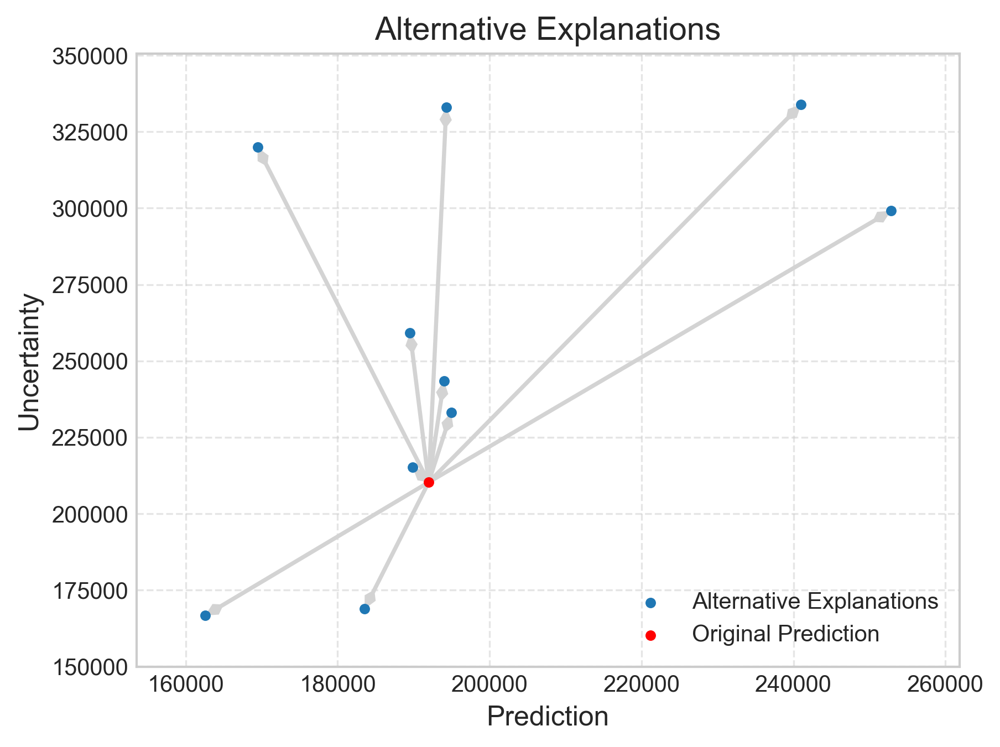

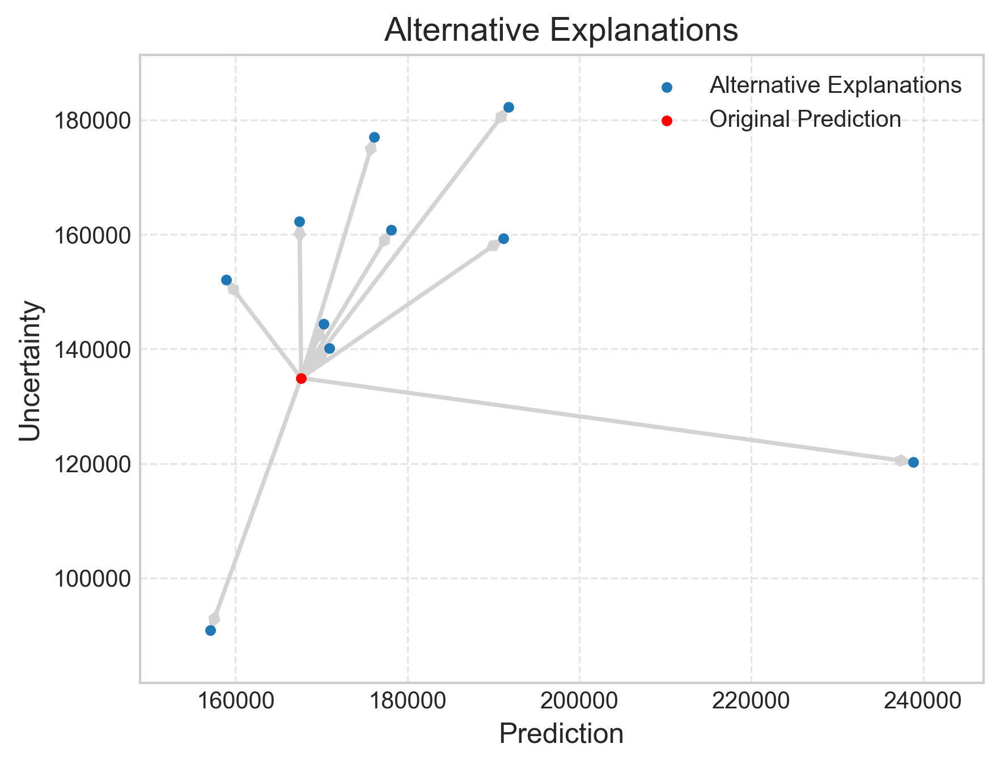


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 191980.735
Prediction Interval: [104172.607, 314468.230]

Alternatives to increase the Calibrated Prediction compared to 191980.735:
- If (total_rooms > 1033.50 AND population < 308.00 AND households < 182.50 AND longitude < -118.33 AND median_income > 4.10)                                                           then 327853.642 [79112.329, 674834.051]
- If (total_rooms > 1033.50 AND population < 308.00 AND longitude < -118.33 AND median_income > 4.10)                                                                                   then 327623.518 [85152.907, 665856.643]
- If (total_bedrooms < 277.50 AND total_rooms > 1033.50 AND population < 308.00 AND households < 182.50 AND longitude < -118.33 AND median_income > 4.10)                               then 326506.570 [69017.531, 685689.575]
- If (population < 308.00 AND households <

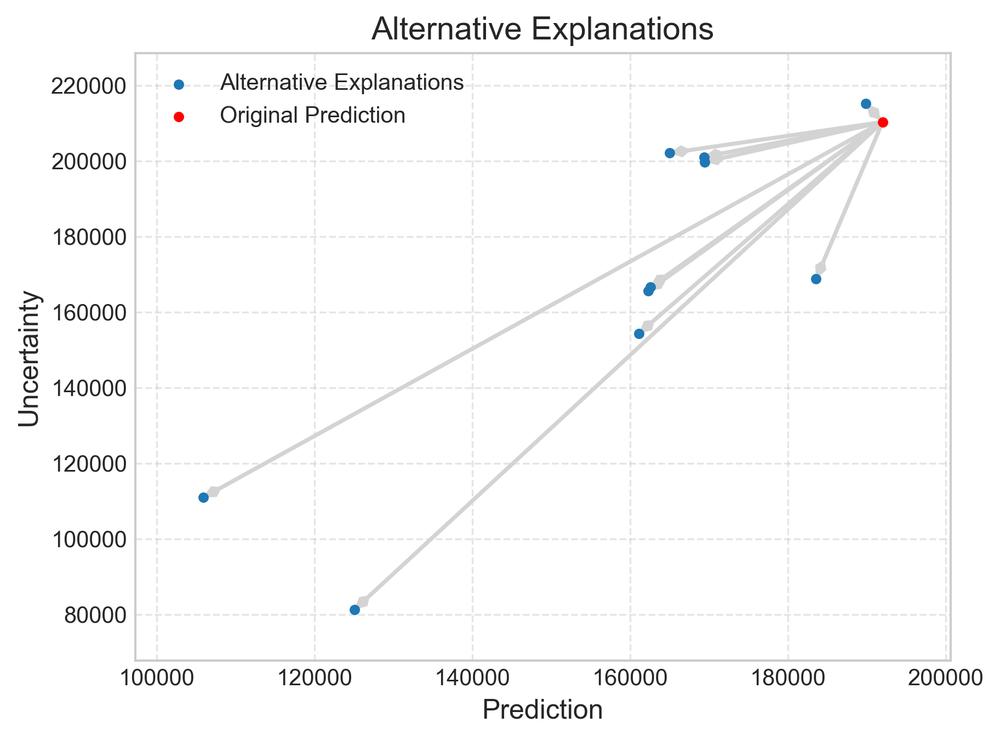

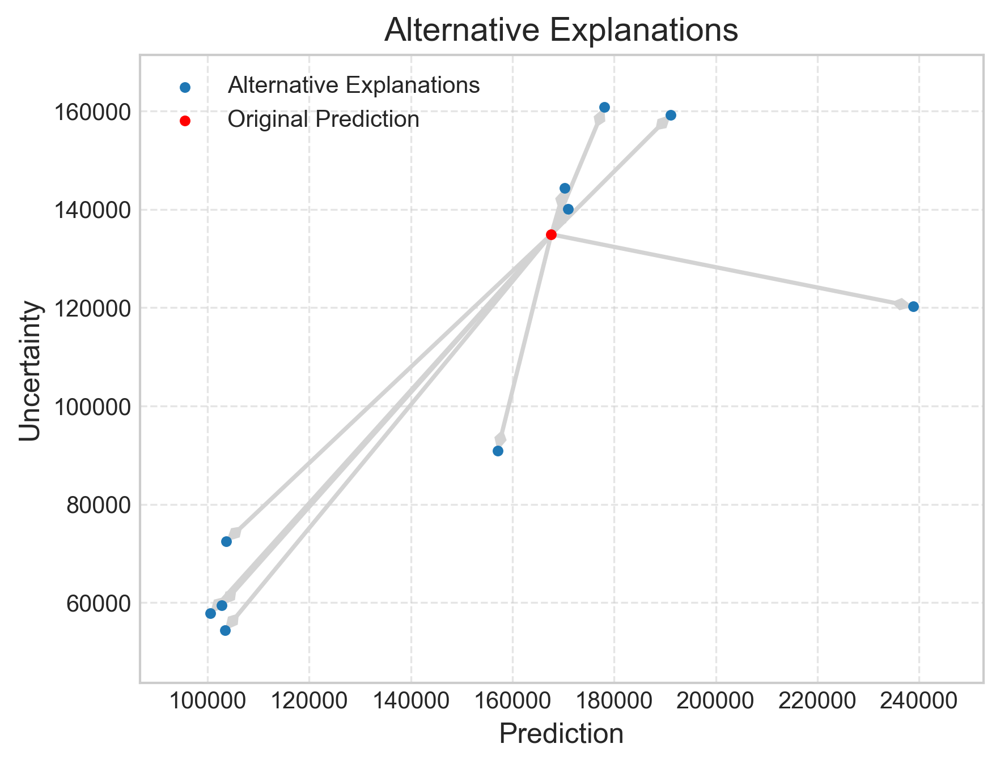

In [41]:
print(alternative_explanation[instances_to_plot].remove_conjunctions().narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")
print(alternative_explanation[instances_to_plot].add_conjunctions(max_rule_size=7).narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 191980.735
Prediction Interval: [104172.607, 314468.230]

Alternatives to increase the Calibrated Prediction compared to 191980.735:
- If longitude < -118.33        then 303884.048 [78441.111, 618364.509]
- If median_income > 4.10       then 252827.193 [127940.301, 427037.518]
- If housing_median_age > 24.50 then 240990.819 [101590.966, 435445.924]
- If total_rooms > 1033.50      then 208802.166 [36956.498, 448517.392]
- If total_bedrooms > 708.50    then 201571.793 [-1350.092, 484636.627]
- If housing_median_age < 5.50  then 194946.586 [97640.650, 330682.999]
- If households > 335.50        then 194293.942 [55268.849, 388226.277]
- If latitude > 34.70           then 193997.524 [92338.112, 335806.794]

Alternatives to decrease the Calibrated Prediction compared to 191980.735:
- If population > 1189.50       then 162544.678 [92955.805, 

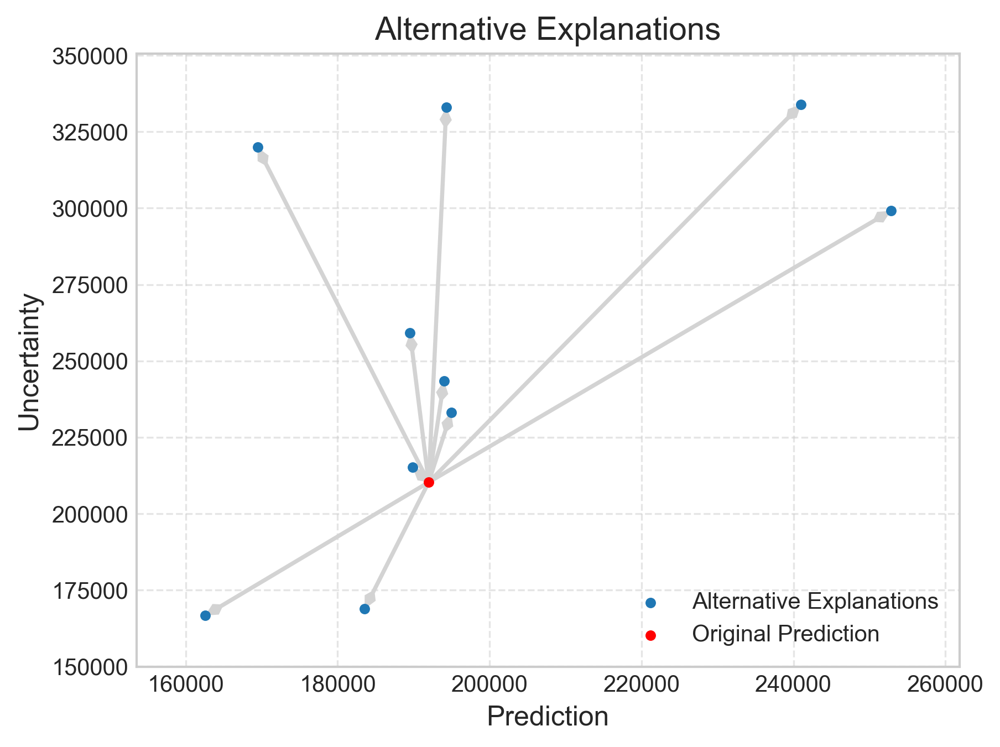

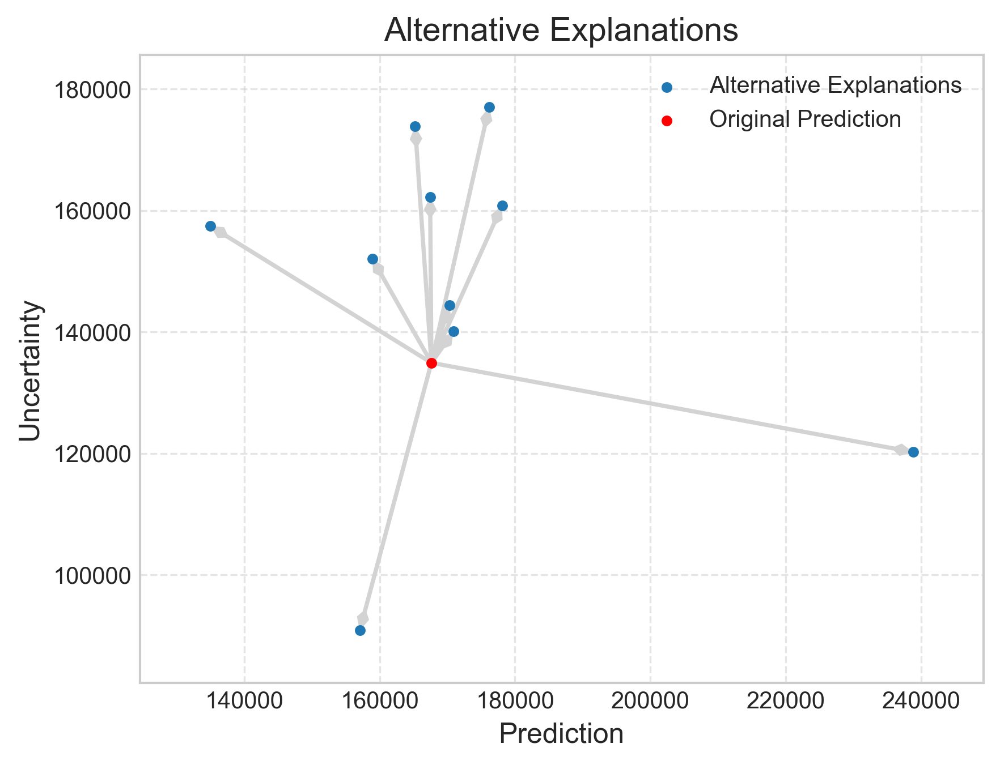


Instance 0

Alternative Explanation (Advanced):
--------------------------------------------------------------------------------
Calibrated Prediction: 191980.735
Prediction Interval: [104172.607, 314468.230]

Alternatives to increase the Calibrated Prediction compared to 191980.735:
- If (housing_median_age < 5.50 AND total_rooms > 1033.50 AND median_income < 2.84 AND population < 308.00 AND households < 182.50 AND longitude < -118.33)                             then 338935.434 [16027.978, 789373.522]
- If (housing_median_age < 5.50 AND median_income < 2.84 AND population < 308.00 AND households < 182.50 AND longitude < -118.33)                                                       then 335338.805 [5187.226, 795882.043]
- If (housing_median_age < 5.50 AND median_income < 2.84 AND population < 308.00 AND total_rooms > 1033.50 AND longitude < -118.33)                                                     then 328767.119 [4635.456, 780912.908]
- If (total_rooms > 1033.50 AND median_incom

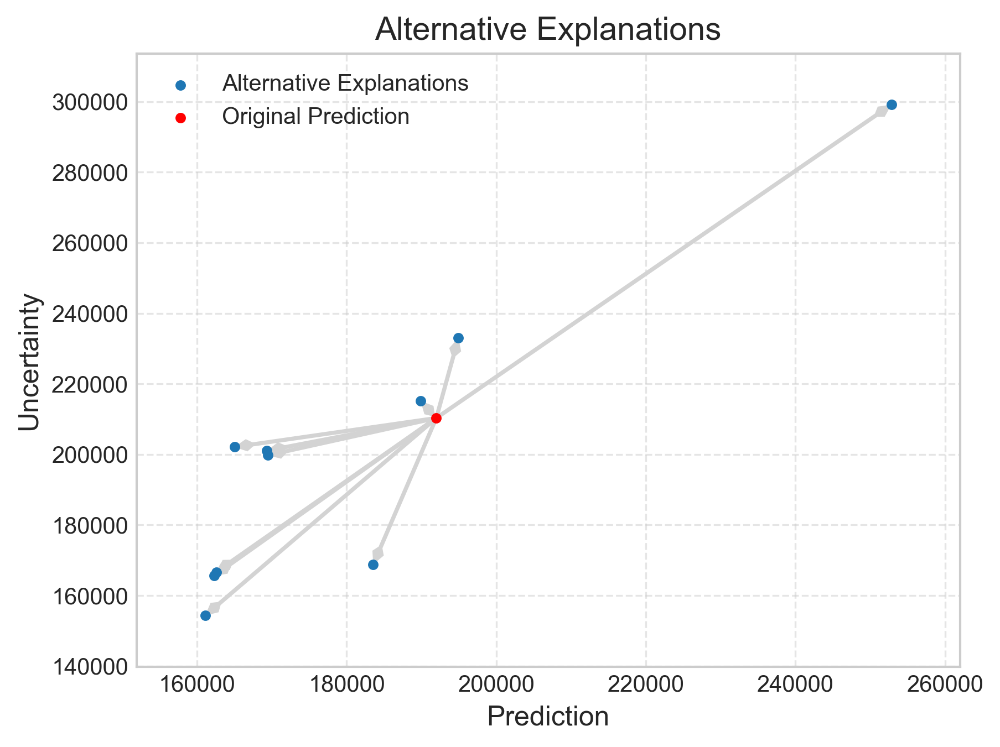

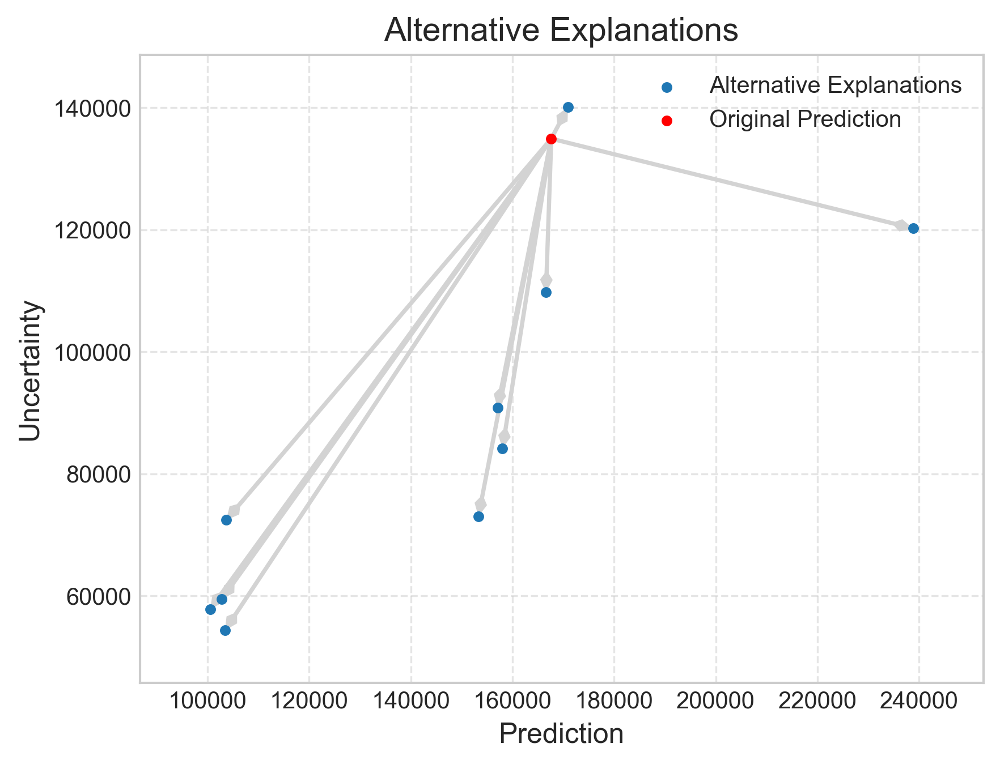

In [42]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=tsi, features_to_ignore=[8])
print(alternative_explanation[instances_to_plot].narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")
print(alternative_explanation[instances_to_plot].add_conjunctions(max_rule_size=7).narrate(expertise_level="advanced", output_format="text"))
alternative_explanation[instances_to_plot].plot(style="ensured")


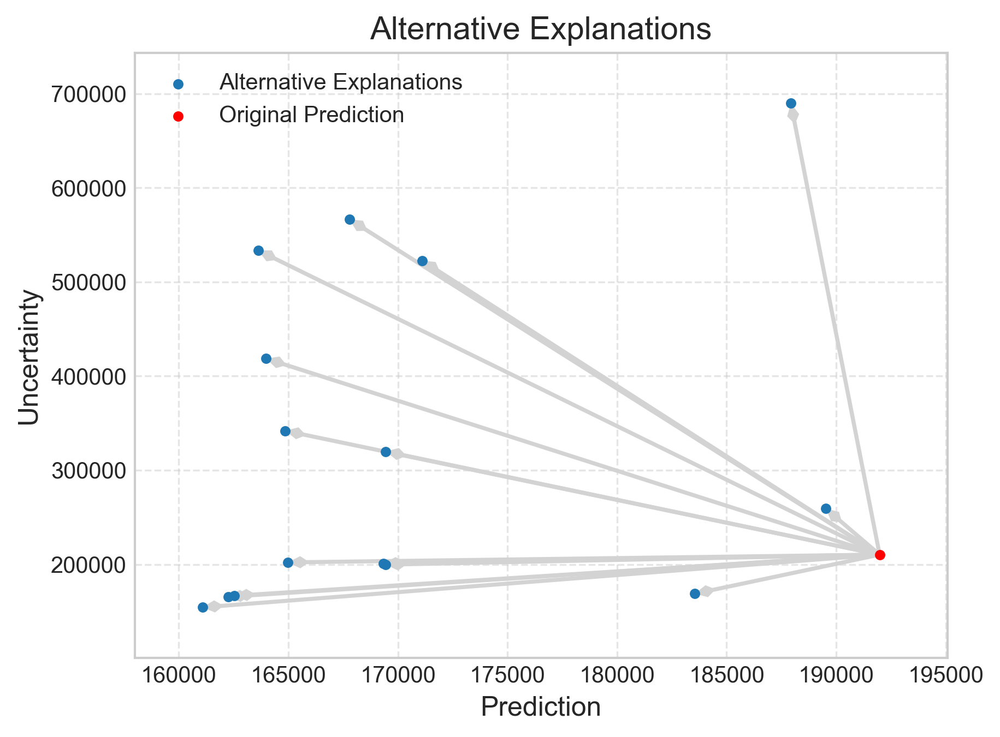

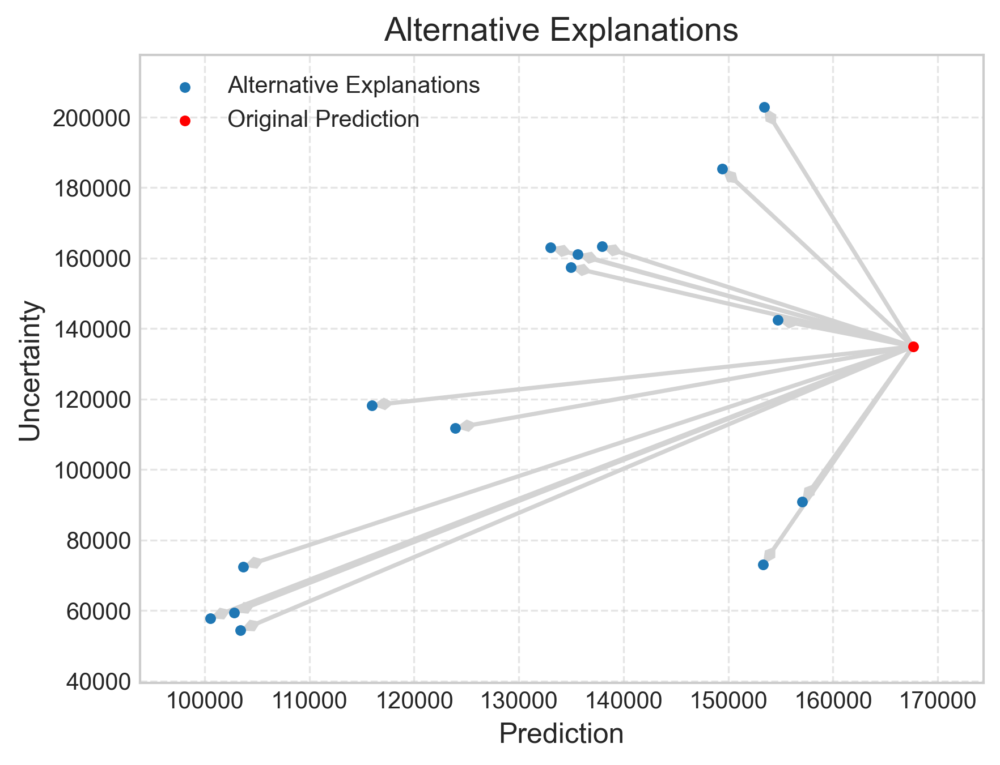

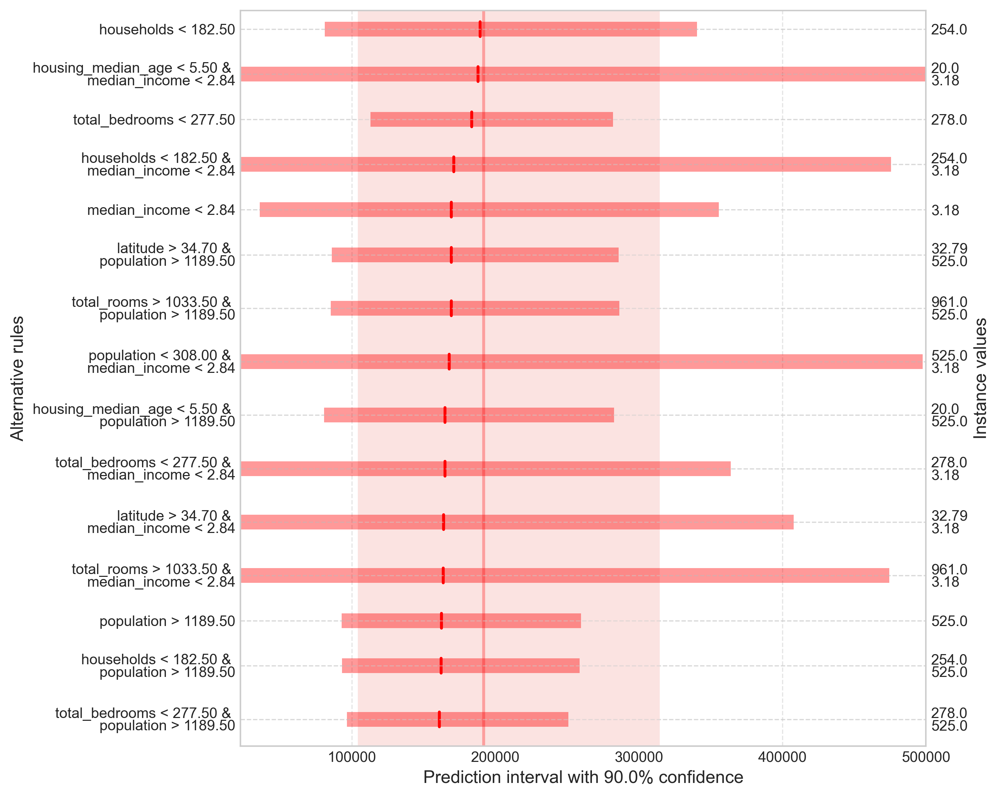

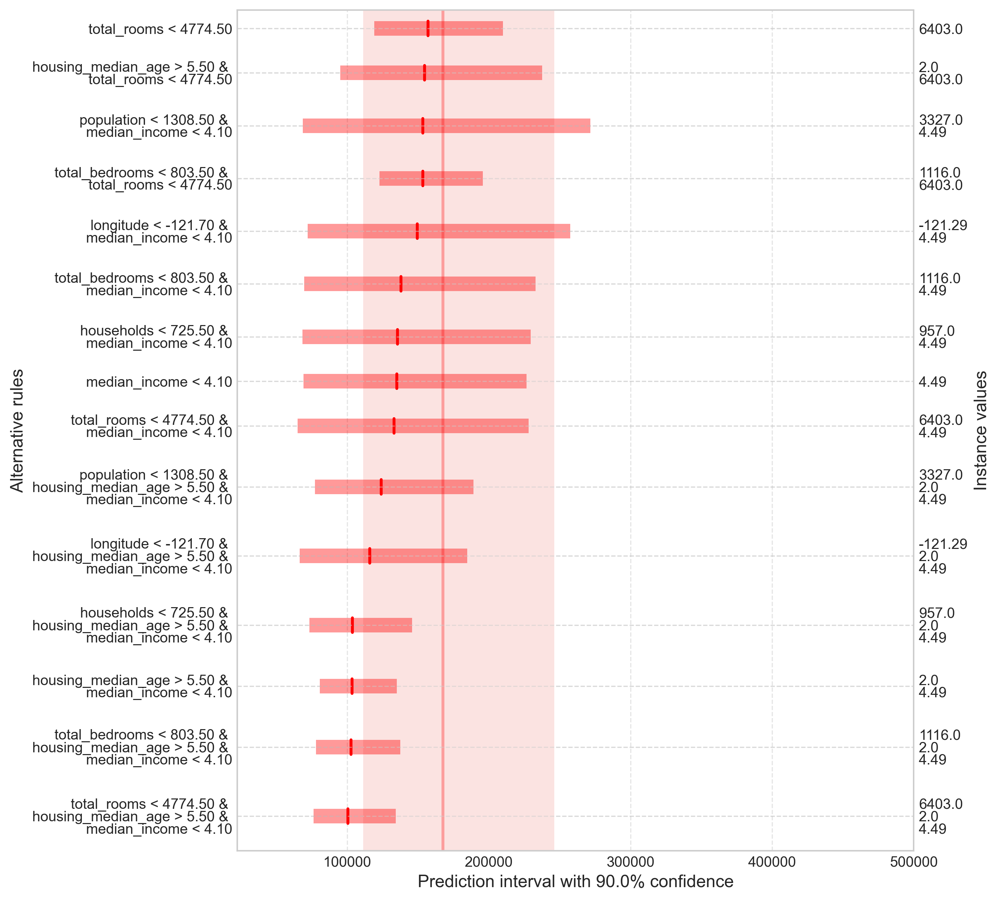

In [43]:
rnk_metric = 'ensured' # 'ensured', 'uncertainty', 'feature_weight'
rnk_weight = -1 # default=0.5. The weight of the uncertainty in the ranking. Used with the 'ensured' ranking metric. 
alternative_explanation[instances_to_plot].plot(style="ensured",filter_top=15, rnk_metric=rnk_metric,rnk_weight=rnk_weight)
alternative_explanation[instances_to_plot].plot(filter_top=15, rnk_metric=rnk_metric,rnk_weight=rnk_weight)

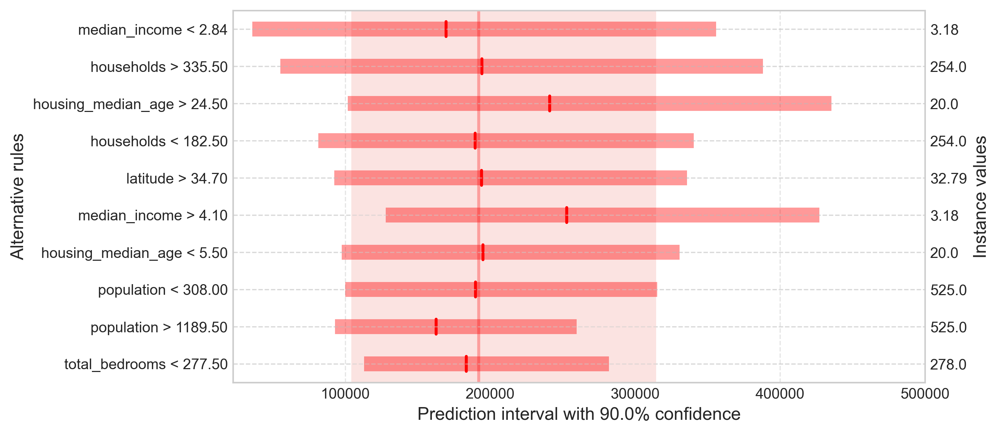

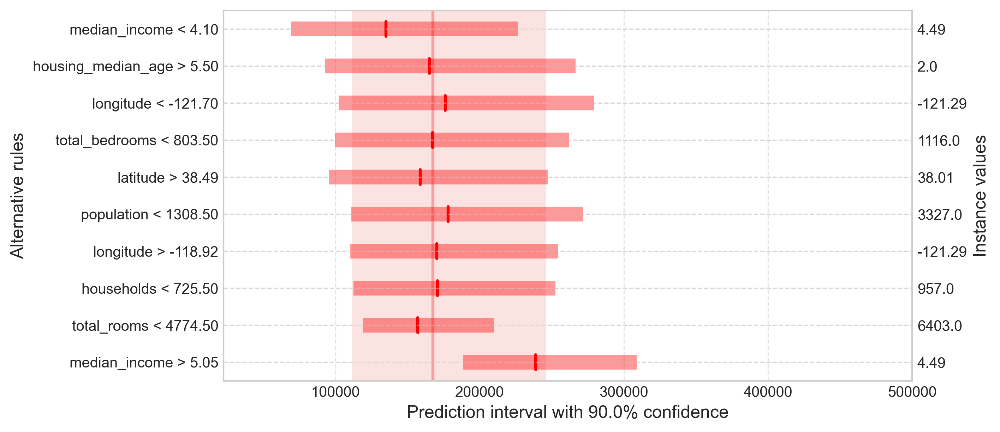

In [44]:
alternative_explanation[instances_to_plot].remove_conjunctions().plot()

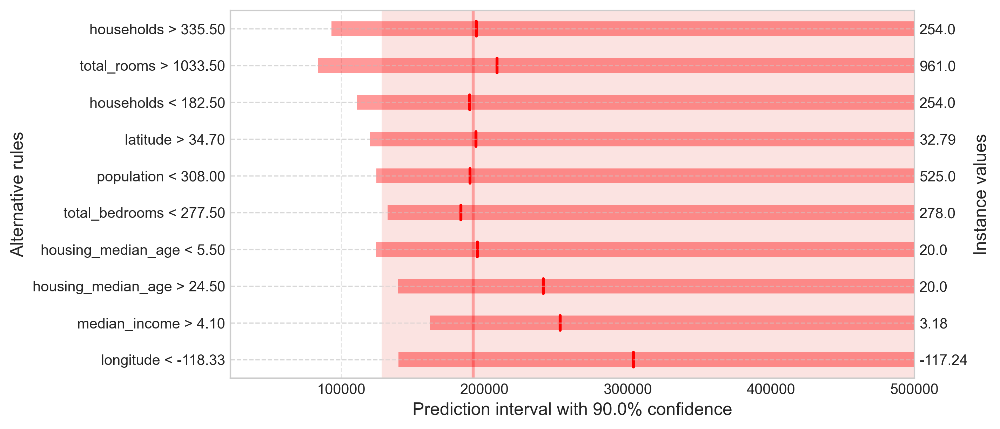

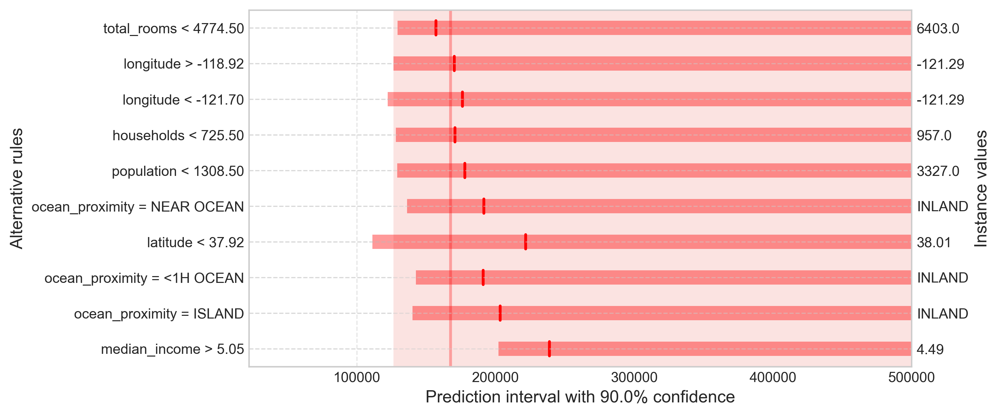

In [45]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osli)
alternative_explanation[instances_to_plot].plot()

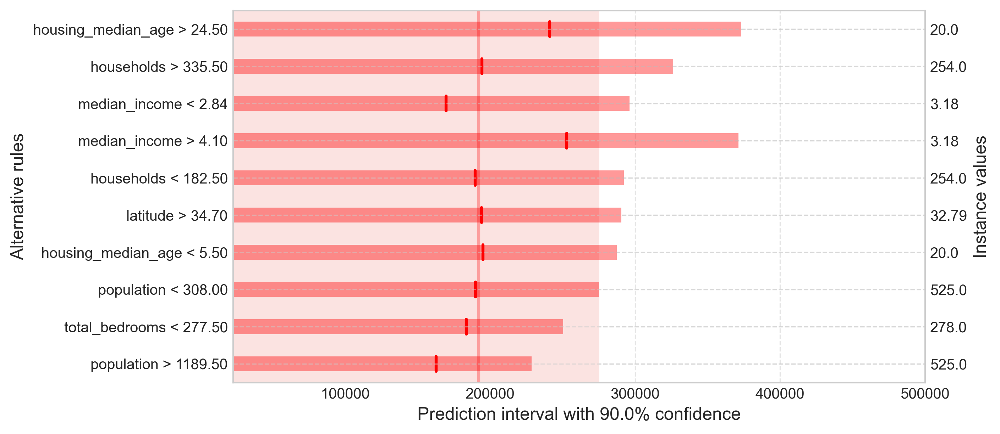

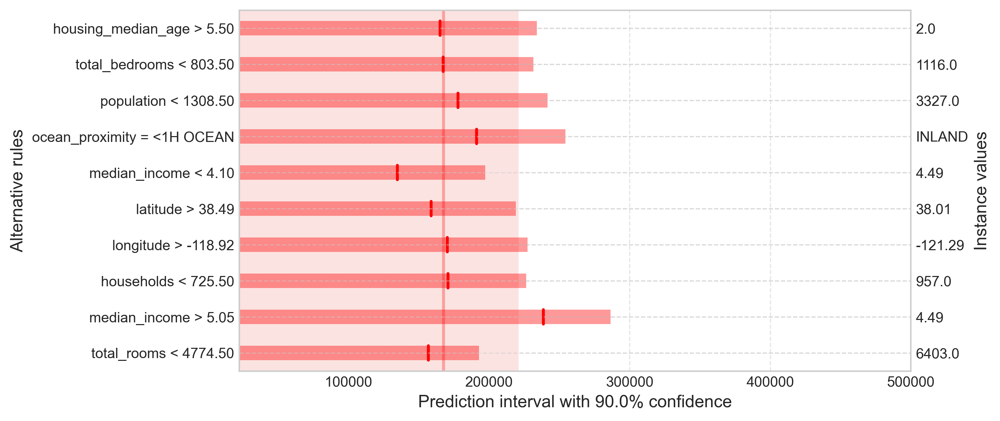

In [46]:
alternative_explanation = ce.explore_alternatives(x_test, low_high_percentiles=osui)
alternative_explanation[instances_to_plot].plot()